## Import Libraries

In [114]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
import requests

#--For importing Files--
import glob
import os

#--For Meraki--
from meraki import meraki
import json
from ipaddress import ip_address
import re
import warnings

## Use API to get Data - Meraki Dashboard (Future Work)

In [2]:
# import requests
# api_key = '29e3f6a3673835a5f82a25fc44f0b2d3bee37ca4'
# orgid = 548641
# networkid = 382837
# # serialnum = 

# myOrgs = meraki.myorgaccess(api_key)

# # myNetworks = meraki.getnetworklist(api_key, orgid)
# # deviceList = meraki.getnetworkdevices(api_key, networkid)
# # # clientList = meraki.getclients(apikey,serialnum)
# print(myOrgs)

# headers = {
#     'X-Cisco-Meraki-API-Key': api_key,
#     'Content-Type': 'application/json',}

# response = requests.get('https://api.meraki.com/api/v0/networks/%7BnetworkId%7D/traffic', headers=headers)

In [3]:
# base_url = 'https://api.meraki.com/api/v0'

In [4]:
# response

## Related Work
- https://www.dw.com/en/overcrowded-refugee-camps-greek-islands/a-46771466
- https://github.com/dw-data/greek-island-refugee-camps/blob/master/migration_notebook_2018-12-03.ipynb


# I. Monthly Traffic Analytics: 
- Dates: Feb27 - March28 2019 (from Meraki Traffic Analytics Dashboard for #NETHOPE FREE WIFI)

In [2]:
#--Source: https://stackoverflow.com/questions/41857659/python-pandas-add-filename-column-csv
# import pandas as pd
# import glob
# import os

globbed_files = glob.glob("Data/traffic_analytics/TrafficAnalytics_Feb27_March28_2019/*.xlsx") #create a list of all csv files

data = [] 
for file in globbed_files:
#     try:
    frame = pd.read_excel(file, sheet_name='traffic')
    frame['filename'] = os.path.basename(file)
    data.append(frame)

#--get filenames and create camp_name column--
traffic_analytics = pd.concat(data, ignore_index=True) 
name_list = ['Moria', 'Nea', 'Vathi', 'Skaram', 'Kos', 'Veria']
    
camp_list = list(traffic_analytics['filename'].unique())
s = '(' + '|'.join(name_list) + ')'
traffic_analytics['camp_name'] = traffic_analytics['filename'].str.extract(s, expand=False)

#--remove filename column--
traffic_analytics = traffic_analytics.drop(['filename'], axis=1)

In [70]:
#--get filenames and create camp_name column--
# name_list = ['Moria', 'Nea', 'Vathi', 'Skaram', 'Kos', 'Veria']
    
# camp_list = list(traffic_analytics['filename'].unique())
# s = '(' + '|'.join(name_list) + ')'
# traffic_analytics['camp_name'] = traffic_analytics['filename'].str.extract(s, expand=False)

In [1]:
traffic_analytics.head()

# --THESIS CODE--

# 1.a Create Dataframes for Weekly Application Data in (kB)
## Weekly Data: from Meraki -- Top Applications by Usage

In [115]:
#--Source: https://stackoverflow.com/questions/41857659/python-pandas-add-filename-column-csv
# Requred Imports for the following code: import pandas as pd, import glob, import os

globbed_files = glob.glob("Data/SummaryReports_byWeek/*.xlsx") #create a list of all csv files

data = [] 
for file in globbed_files:
    try:
        frame = pd.read_excel(file, sheet_name='Top applications by usage')
        frame['filename'] = os.path.basename(file)
        data.append(frame)
    except:
        frame['Application'] = 0
        frame['Usage (kB)'] = 0
        frame['% Usage'] = 0
        frame['filename'] = os.path.basename(file)
        print(os.path.basename(file))
        data.append(frame)
        
app_usage = pd.concat(data, ignore_index=True) 

Week45_Skaram.xlsx
Week52_Moria.xlsx
Week20_VathiS.xlsx
Week19_VathiS.xlsx
~$Week53_VathiS.xlsx
Week53_Moria.xlsx


In [116]:
#--get filenames and create camp_name column--
name_list = ['Moria', 'Nea', 'Vathi', 'Skaram', 'Kos', 'Veria']
    
camp_list = list(app_usage['filename'].unique())
s = '(' + '|'.join(name_list) + ')'
app_usage['camp_name'] = app_usage['filename'].str.extract(s, expand=False)

#--Add week number--
week_lst = list(range(1,54))
wk_lst = []
for week in week_lst:
    week = 'Week'+str(week)+'_'
    wk_lst.append(week)

#--Adding week_num column--
weeks = list(app_usage['filename'].unique())
m = '(' + '|'.join(wk_lst) + ')'
app_usage['week_num'] = app_usage['filename'].str.extract(m, expand=False) 

#--Remove string values and convert to numeric
app_usage['week_num'] = app_usage['week_num'].str.replace('Week','')
app_usage['week_num'] = app_usage['week_num'].str.replace('_','')
app_usage['week_num'] = pd.to_numeric(app_usage['week_num'])

#--Find daily usage for each application--
# app_usage['usage_per_day_kb'] = app_usage['Usage (kB)'].div(7)

#--Rename Usage (kB)
app_usage['usage_per_week_kb'] = app_usage['Usage (kB)']

In [111]:
#--Send to .csv file--
app_usage.to_csv('53_weeks_application_usage22.csv')

In [117]:
app_usage.Application.unique()

array(['YouTube', 'Miscellaneous secure web', 'Facebook', 'UDP',
       'Google HTTPS', 'Non-web TCP', 'Miscellaneous web', 'iTunes',
       'CDNs', 'Meraki HTTPS', 'Miscellaneous video', 'Google', 'Twitter',
       'Google advertising', 'ICMP', 'apple.com', 'iCloud', 'SSH',
       'Snapchat', 'Google Drive', 'DNS', 'Instagram', 'BitTorrent',
       'microsoft.com', 'Miscellaneous audio',
       'Real Time Streaming Protocol', 'mediafire.com', 'Dropbox',
       'mopub', 'Encrypted TCP (SSL)', 'Gmail', 'Line',
       'RTMP (Adobe Flash)', 'SOCKS proxy', 'Yahoo', 'Yahoo Mail',
       'Software updates', 'Skype', 'Google Maps', 'moatads',
       'Dailymotion', 'Encrypted P2P', 'baidu.com', 'New York Times',
       'Spotify', 'WordPress', 'Bing', 'Hotmail', 'Microsoft OneDrive',
       'Live.com', 'Blogger', 'Tumblr',
       'Host-based email (POP3/IMAP/SMTP)', 'Wikipedia', 'Google+',
       'Pinterest', 'BBC iPlayer', 'AppNexus', 'PlayStation',
       'Windows Live Hotmail and Outlook', '

In [343]:
totals = app_usage.groupby('Application').sum().reset_index()
# totals.columns
# totals.sort_values(by=['Usage (kb)'])

totals.sort_values(by=['Usage (kB)'], ascending=False)



0.030679979422532068

In [420]:
m = totals.sort_values(by=['Usage (kB)'], ascending=False)
top10usage = m.iloc[0:10]

In [22]:
app_usage.columns

Index(['Application', 'Usage (kB)', '% Usage', 'filename', 'camp_name',
       'week_num', 'usage_per_day_kb', 'usage_per_week_kb'],
      dtype='object')

In [2]:
app_usage

In [8]:
app_usage.columns

Index(['Application', 'Usage (kB)', '% Usage', 'filename', 'camp_name',
       'week_num', 'usage_per_month_kb', 'usage_per_week_kb',
       'usage_per_day_kb'],
      dtype='object')

In [64]:
#--List of all applications in top 100 list for one year--
# app_list = list(app_usage['Application'].unique())
# len(app_list)

# 1.a. Total application usage in (kB) per week, day, month for all camps 

In [ ]:
sns.set()
plt.figure(figsize=(25,12))
plt.title('Application Usage in (kB) For Six Camps')
sns.barplot(x='Application', y='usage_per_month_kb', 
             data=app_usage, order=app_usage['usage_per_month_kb'] )
plt.xticks(rotation=90)

In [119]:
def usage_per(y_):
    sns.set()
    plt.figure(figsize=(25,12))
    plt.title('Application Usage in (kB) For Six Camps')
    sns.barplot(x='Application', y=y_, 
                 data=app_usage, order=app_usage[y_] )
    plt.xticks(rotation=90)

In [ ]:
monthly = usage_per('usage_per_month_kb')

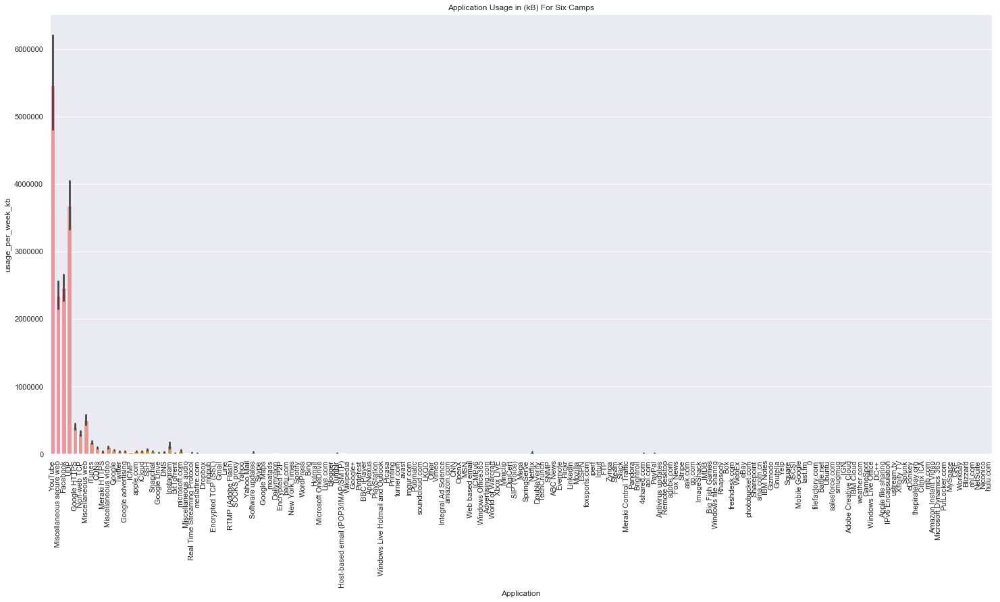

In [18]:
weekly = usage_per('usage_per_week_kb')

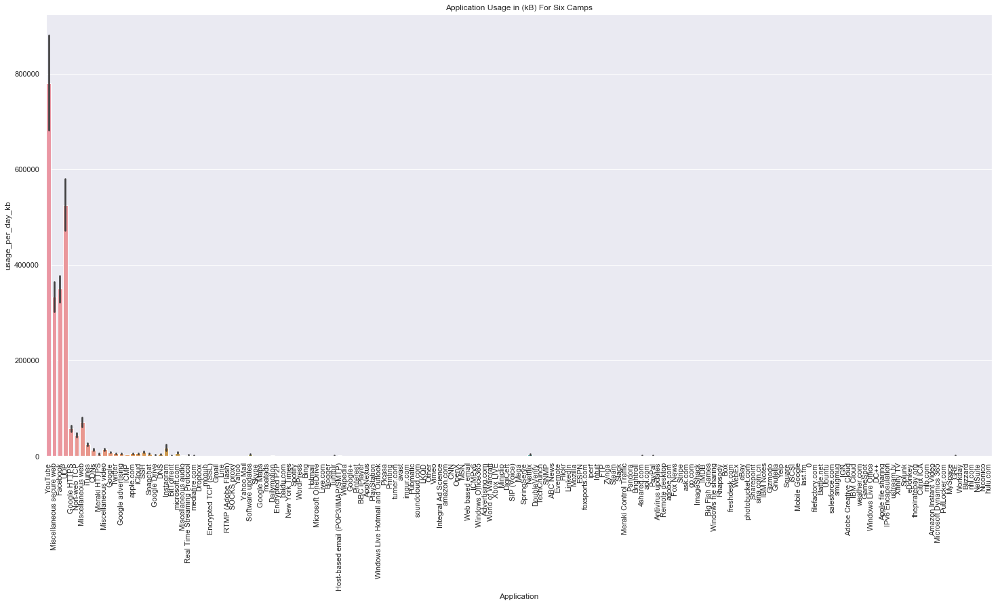

In [20]:
daily = usage_per('usage_per_day_kb')

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168]),
 <a list of 169 Text xticklabel objects>)

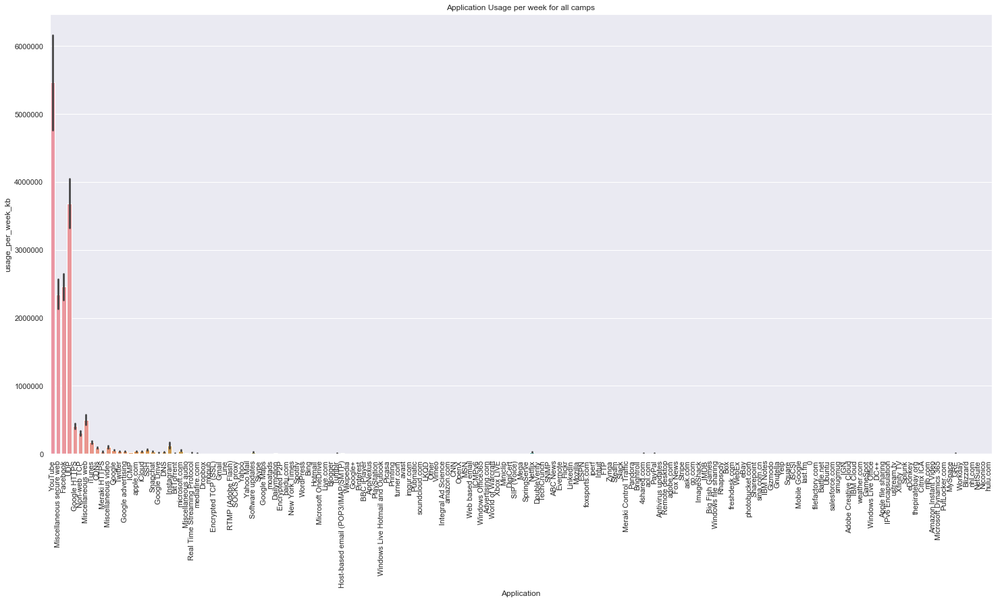

In [11]:
sns.set()
plt.figure(figsize=(25,12))
plt.title('Application Usage per week for all camps')
sns.barplot(x='Application', y='usage_per_week_kb', 
             data=app_usage)
plt.xticks(rotation=90)

## Dataframes by Camp for Total/All Application Usage including Web Protocols (per Application)

In [133]:
moria = app_usage[app_usage['camp_name']=='Moria']
kos = app_usage[app_usage['camp_name']=='Kos']
nea = app_usage[app_usage['camp_name']=='Nea']
skaram = app_usage[app_usage['camp_name']=='Skaram']
vathi = app_usage[app_usage['camp_name']=='Vathi']
veria = app_usage[app_usage['camp_name']=='Veria']

In [38]:
#--Try without YouTube--
moria_noYT = moria[moria.Application != 'YouTube']
len(moria_noYT)

5186

# 2. Web Applications (not including Protocols)

In [3]:
protocols = ['UDP','CDNs','Non-web TCP','ICMP','SSH','DNS','Real Time Streaming Protocol',
             'SOCKS proxy','Encrypted P2P','FTP', 'TCP', 'Encrypted TCP (SSL)']
app_df = app_usage[~app_usage.Application.isin(protocols)]
app_df.head()

In [132]:
moria_app = app_df[app_df['camp_name']=='Moria']
kos_app = app_df[app_df['camp_name']=='Kos']
nea_app = app_df[app_df['camp_name']=='Nea']
skaram_app = app_df[app_df['camp_name']=='Skaram']
vathi_app = app_df[app_df['camp_name']=='Vathi']
veria_app = app_df[app_df['camp_name']=='Veria']

In [399]:
#--barplot of usage per camp - top 15 applications-- 
def bar_top10(camp):
    grouped = camp.groupby('Application').sum()
    grouped = grouped.sort_values('Usage (kB)', ascending=False)
    grouped = grouped[:20]
    grouped = grouped.reset_index()
    
    sns.set(style="whitegrid", font_scale = 2)
    plt.figure(figsize=(25,12))
    plt.title('Application Usage - ' + camp['camp_name'].unique()[0])
    sns.barplot(y='Application', x='Usage (kB)', data=grouped, orient='h')
    
#     sns.barplot(y='Application', x='Hours_per_Client', data=grouped, orient='h', color='g')
    
    plt.xticks(rotation=90)
    
#--Time Series for Application Usage per camp-- 
def time_app_usage(camp):
    grouped = camp.groupby('Application').sum()
    grouped = grouped.sort_values('Usage (kB)', ascending=False)
    grouped = grouped[:10]
    grouped = grouped.reset_index()
    
    sns.set(style="whitegrid")
    plt.figure(figsize=(24,16))
    plt.title('Application Usage per Week in kB - ' + camp['camp_name'].unique()[0], fontsize = 35)
    ax = sns.lineplot(x="week_num", y='Usage (kB)', hue="Application", 
                 data=camp)
    ax.set_xlabel('Week Number',fontsize=25);
    ax.set_ylabel('Usage in Kilobytes',fontsize=25)
    ax.tick_params(labelsize=20)
    plt.xticks(rotation=30)
    ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize=20)

In [388]:
# time_app_usage(app_usage)
# plt.title("Web Application Usage for a Year in kB across Six camps")

Text(0.5,1,'Web Application Usage for a Year in kB across Six camps')

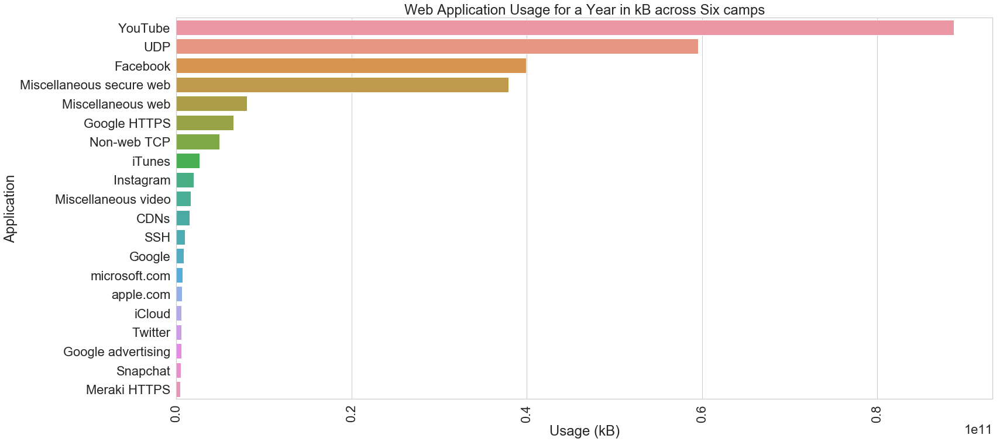

In [124]:
bar_top10(app_usage)
plt.title("Web Application Usage for a Year in kB across Six camps")

## Make dataframe containing all of the "Data Hoggers"

In [400]:
top20_app_lst = ['YouTube', 'UDP', 'Facebook', 'Miscellaneous secure web', 'Miscellaneous web', 'Google HTTPS', 'Non-web TCP',
                'iTunes', 'Instagram', 'Miscellaneous video', 'CDNs', 'SSH', 'Google', 'microsoft.com', 'apple.com', 'Snapchat',
                'iCloud', 'Twitter', 'Google advertising', 'Meraki HTTPS']

data_hoggers = app_usage[app_usage.Application.isin(top20_app_lst)]


top10_app_lst = ['YouTube', 'UDP', 'Facebook', 'Miscellaneous secure web', 'Miscellaneous web', 'Google HTTPS', 'Non-web TCP',
                'iTunes', 'Instagram', 'Miscellaneous video']
data_hoggers10 = app_usage[app_usage.Application.isin(top10_app_lst)]

In [401]:
#--Top 20--
moria_hog = data_hoggers[data_hoggers['camp_name']=='Moria']
kos_hog = data_hoggers[data_hoggers['camp_name']=='Kos']
nea_hog = data_hoggers[data_hoggers['camp_name']=='Nea']
skaram_hog = data_hoggers[data_hoggers['camp_name']=='Skaram']
vathi_hog = data_hoggers[data_hoggers['camp_name']=='Vathi']
veria_hog = data_hoggers[data_hoggers['camp_name']=='Veria']


#--Top 10--
moria_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Moria']
kos_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Kos']
nea_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Nea']
skaram_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Skaram']
vathi_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Vathi']
veria_hog10 = data_hoggers10[data_hoggers10['camp_name']=='Veria']

In [385]:
tot = data_hoggers.groupby(by='Application').sum()
tot.sort_values('Usage (kB)',ascending=False)

,Usage (kB),% Usage,week_num,usage_per_week_kb
Application,,,,
YouTube,8.870283e+10,8605.664441,8121,8.870283e+10
UDP,5.952929e+10,8006.594607,8121,5.952929e+10
Facebook,3.990833e+10,4752.683243,8121,3.990833e+10
Miscellaneous secure web,3.789905e+10,4700.978628,8121,3.789905e+10
Miscellaneous web,8.067230e+09,1005.687030,8121,8.067230e+09
Google HTTPS,6.560550e+09,762.549866,8121,6.560550e+09
Non-web TCP,4.908606e+09,700.503695,8121,4.908606e+09
iTunes,2.673825e+09,374.292093,7758,2.673825e+09
Instagram,2.006784e+09,141.478128,8121,2.006784e+09


In [322]:
m = data_hoggers.head()
m['Usage (kB)'].sum()

2199341165.4179688

In [323]:
data_hoggers['Usage (kB)'].sum() - m['Usage (kB)'].sum()

257203915343.7578

In [316]:
# bar_top10(data_hoggers)
# plt.title("Total Web Application Usage for a Year in kB across Six camps", fontsize=30)

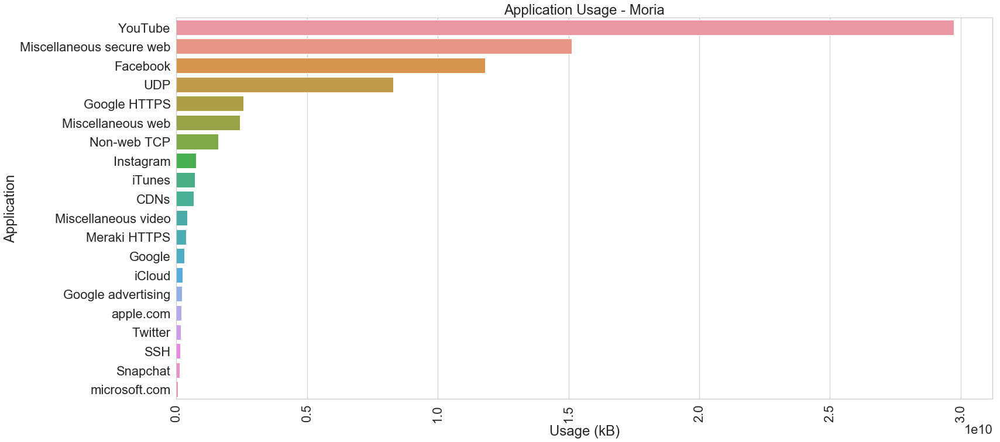

In [387]:
bar_top10(moria_hog)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Moria')

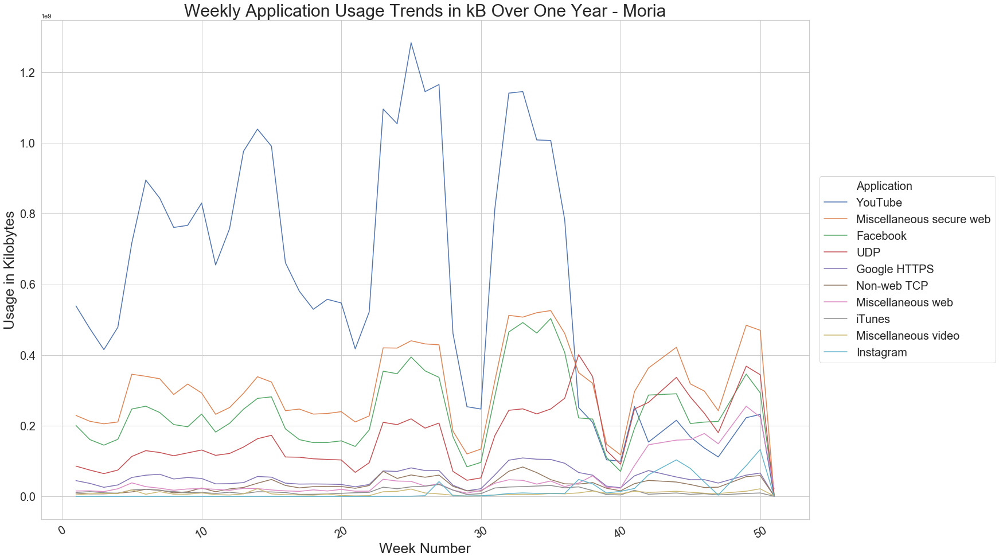

In [413]:
time_app_usage(moria_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Moria", fontsize=30)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Kos')

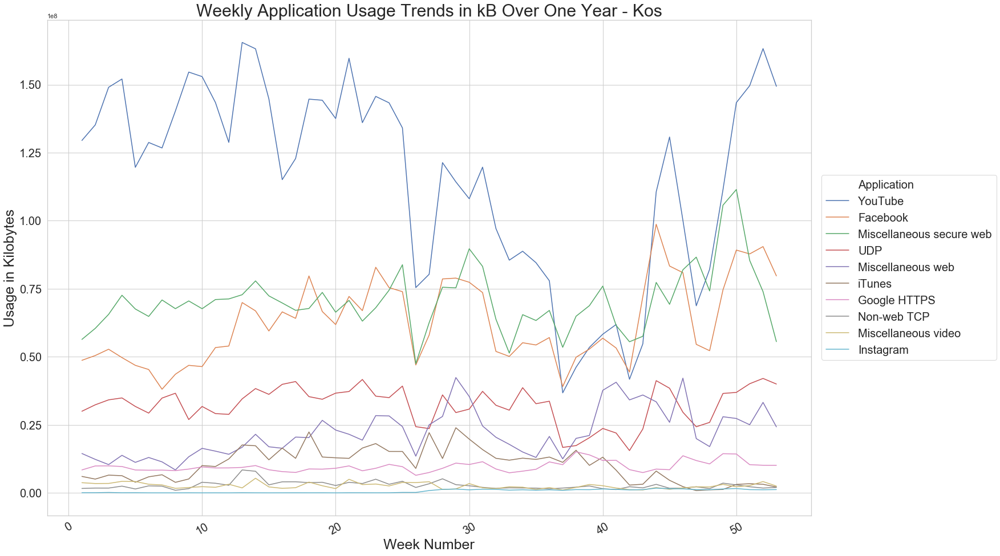

In [414]:
time_app_usage(kos_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Kos", fontsize=30)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Nea Kavala')

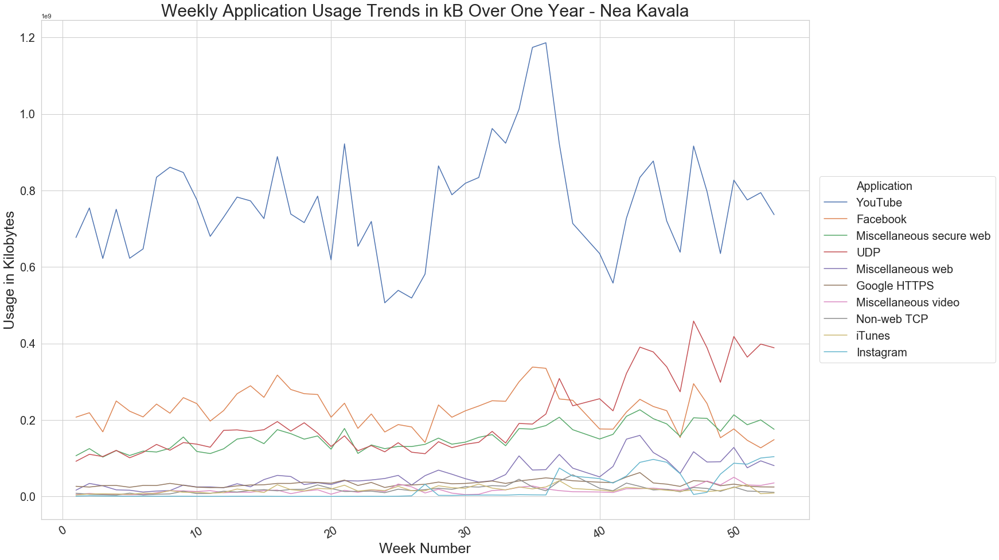

In [412]:
time_app_usage(nea_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Nea Kavala", fontsize=30)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Skaramangas')

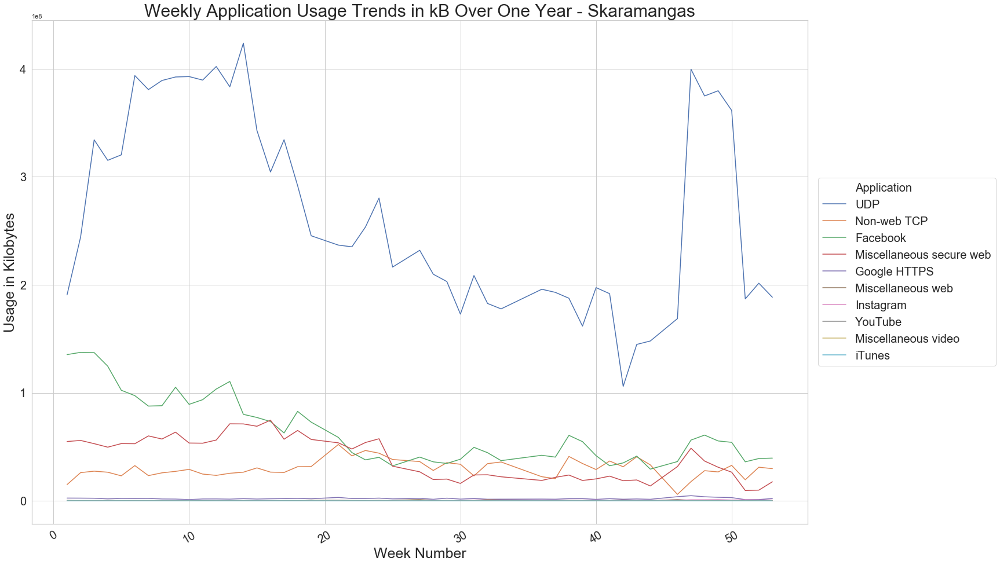

In [415]:
time_app_usage(skaram_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Skaramangas", fontsize=30)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Vathi Samos')

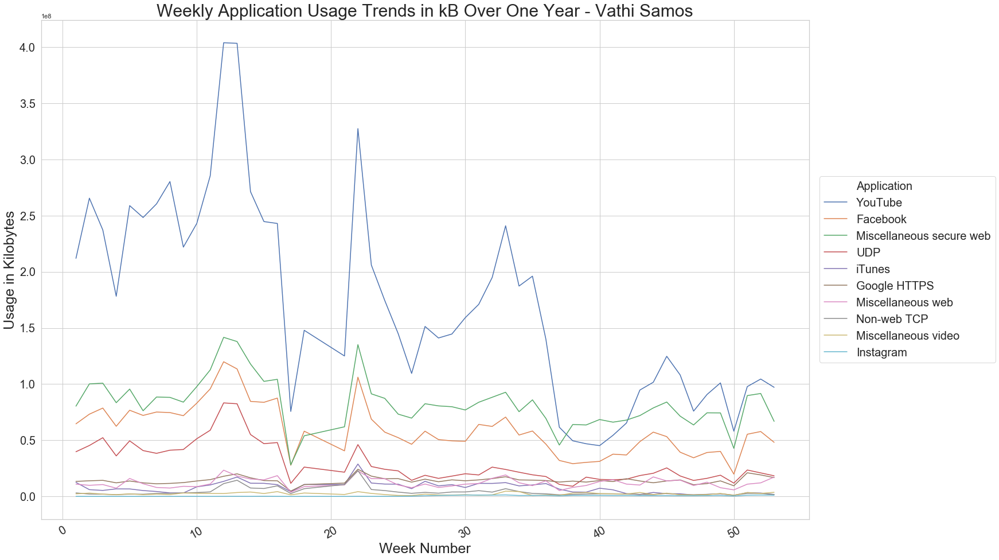

In [416]:
time_app_usage(vathi_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Vathi Samos", fontsize=30)

Text(0.5,1,'Weekly Application Usage Trends in kB Over One Year - Veria')

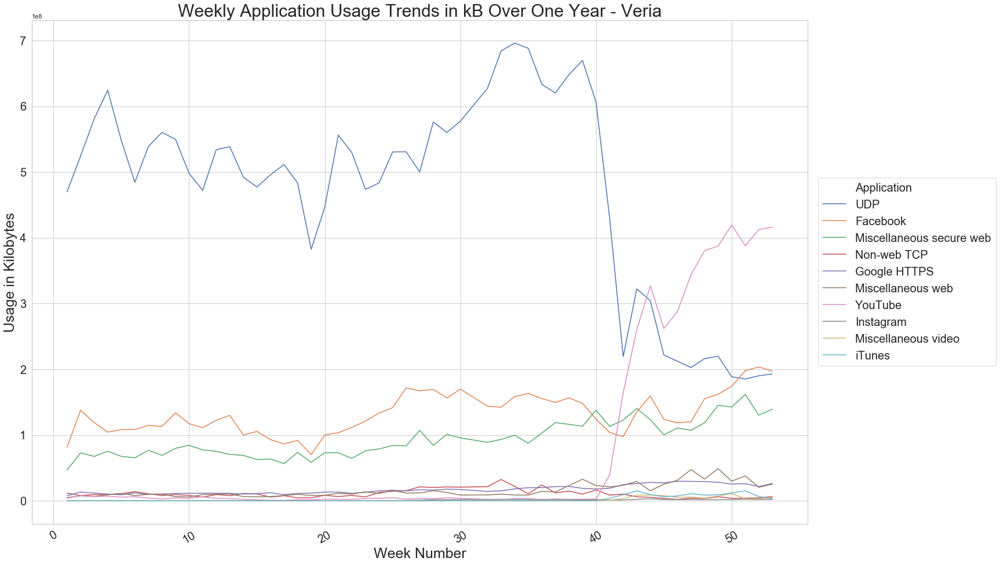

In [417]:
time_app_usage(veria_hog10)
plt.title("Weekly Application Usage Trends in kB Over One Year - Veria", fontsize=30)

# Time Series Predictions -- Moria (YouTube only)

In [4]:
moria_hog

In [252]:
import warnings
warnings.filterwarnings('ignore')

In [242]:
#--make future dataframe--
moriahog2 = moria_hog[moria_hog.Application=='YouTube']
moriahog2 = moriahog2.rename(columns={'week_num': 'ds', 'Usage (kB)':'y'})
moriahog2 = moriahog2[['ds', 'y']]
moriahog2 = moriahog2.sort_values(by='ds')
# moriahog2.head(50)

In [424]:
import datetime
base = datetime.datetime.today()
# base = datetime.datetime.strptime('01012018', '%d%m%Y').date()
# base

date_list = [base - datetime.timedelta(days=x) for x in range(0, len(moriahog2.ds))]
# date_list
# moriahog2.ds = pd.to_datetime(date_list)

In [275]:
import fbprophet
# moriahog2_prophet = fbprophet.Prophet(changepoint_prior_scale=.15, weekly_seasonality=False, yearly_seasonality=True, daily_seasonality=False).fit(moriahog2)

In [279]:
# moriahog2_prophet

Text(0.5,1,'Weekly YouTube Usage in kB - Moria')

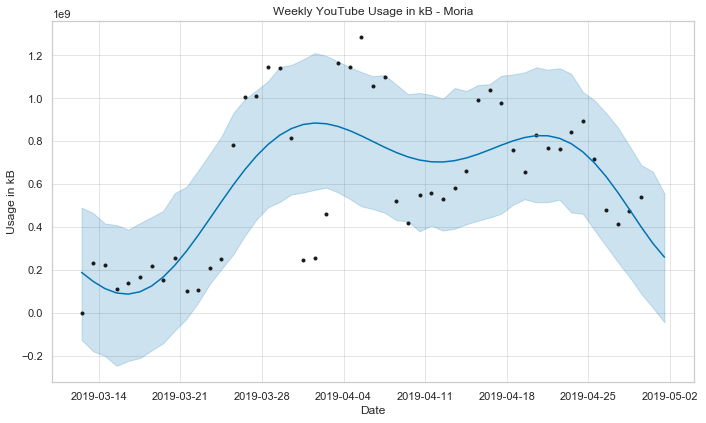

In [297]:
import fbprophet
moriahog2_prophet = fbprophet.Prophet(changepoint_prior_scale=.015, weekly_seasonality=False, yearly_seasonality=True, daily_seasonality=False).fit(moriahog2)

moriahog2_forecast = moriahog2_prophet.make_future_dataframe(periods=2, freq='D')
# moriahog2_forecast

#--make predictions
moriahog2_forecast = moriahog2_prophet.predict(moriahog2_forecast)


moriahog2_prophet.plot(moriahog2_forecast, xlabel='Date', ylabel='Usage in kB')
plt.title("Weekly YouTube Usage in kB - Moria")

In [421]:
moriahog2_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-03-12 12:37:13.558956,1.570212e+07,-1.263486e+08,4.900042e+08,1.570212e+07,1.570212e+07,1.723455e+08,1.723455e+08,1.723455e+08,1.723455e+08,1.723455e+08,1.723455e+08,0.0,0.0,0.0,1.880476e+08
1,2019-03-13 12:37:13.558956,3.047160e+07,-1.799383e+08,4.637965e+08,3.047160e+07,3.047160e+07,1.152663e+08,1.152663e+08,1.152663e+08,1.152663e+08,1.152663e+08,1.152663e+08,0.0,0.0,0.0,1.457379e+08
2,2019-03-14 12:37:13.558956,4.524108e+07,-2.011483e+08,4.154230e+08,4.524108e+07,4.524108e+07,6.734636e+07,6.734636e+07,6.734636e+07,6.734636e+07,6.734636e+07,6.734636e+07,0.0,0.0,0.0,1.125874e+08
3,2019-03-15 12:37:13.558956,6.001055e+07,-2.474096e+08,4.082952e+08,6.001055e+07,6.001055e+07,3.215184e+07,3.215184e+07,3.215184e+07,3.215184e+07,3.215184e+07,3.215184e+07,0.0,0.0,0.0,9.216239e+07
4,2019-03-16 12:37:13.558956,7.478003e+07,-2.242902e+08,3.871389e+08,7.478003e+07,7.478003e+07,1.198985e+07,1.198985e+07,1.198985e+07,1.198985e+07,1.198985e+07,1.198985e+07,0.0,0.0,0.0,8.676988e+07
5,2019-03-17 12:37:13.558956,8.954951e+07,-2.110371e+08,4.172017e+08,8.954951e+07,8.954951e+07,7.955539e+06,7.955539e+06,7.955539e+06,7.955539e+06,7.955539e+06,7.955539e+06,0.0,0.0,0.0,9.750505e+07
6,2019-03-18 12:37:13.558956,1.043190e+08,-1.758558e+08,4.453127e+08,1.043190e+08,1.043190e+08,2.002183e+07,2.002183e+07,2.002183e+07,2.002183e+07,2.002183e+07,2.002183e+07,0.0,0.0,0.0,1.243408e+08
7,2019-03-19 12:37:13.558956,1.190885e+08,-1.415657e+08,4.745247e+08,1.190885e+08,1.190885e+08,4.716568e+07,4.716568e+07,4.716568e+07,4.716568e+07,4.716568e+07,4.716568e+07,0.0,0.0,0.0,1.662541e+08
8,2019-03-20 12:37:13.558956,1.338579e+08,-8.262268e+07,5.576981e+08,1.338579e+08,1.338579e+08,8.752403e+07,8.752403e+07,8.752403e+07,8.752403e+07,8.752403e+07,8.752403e+07,0.0,0.0,0.0,2.213820e+08
9,2019-03-21 12:37:13.558956,1.486274e+08,-2.832586e+07,5.865125e+08,1.486274e+08,1.486274e+08,1.385714e+08,1.385714e+08,1.385714e+08,1.385714e+08,1.385714e+08,1.385714e+08,0.0,0.0,0.0,2.871988e+08


In [442]:
#--cross validation
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(moriahog2_prophet, initial='40 days', period='1 days' ,horizon = '8 days')
df_cv

INFO:fbprophet.diagnostics:Making 1 forecasts with cutoffs between 2019-04-21 12:37:13.558956 and 2019-04-21 12:37:13.558956


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2019-04-22 12:37:13.558956,8.714422e+08,-5.856535e+07,1.848431e+09,7.611879e+08,2019-04-21 12:37:13.558956
1,2019-04-23 12:37:13.558956,8.701817e+08,-5.033625e+07,1.851375e+09,8.439700e+08,2019-04-21 12:37:13.558956
2,2019-04-24 12:37:13.558956,8.734588e+08,-8.538156e+07,1.899148e+09,8.952861e+08,2019-04-21 12:37:13.558956
3,2019-04-25 12:37:13.558956,8.811901e+08,-1.173683e+08,1.890942e+09,7.173204e+08,2019-04-21 12:37:13.558956
4,2019-04-26 12:37:13.558956,8.932022e+08,-8.022939e+07,1.866380e+09,4.787668e+08,2019-04-21 12:37:13.558956
5,2019-04-27 12:37:13.558956,9.092402e+08,3.915508e+07,1.829570e+09,4.153960e+08,2019-04-21 12:37:13.558956
6,2019-04-28 12:37:13.558956,9.289764e+08,-2.145188e+07,1.858903e+09,4.747386e+08,2019-04-21 12:37:13.558956
7,2019-04-29 12:37:13.558956,9.520212e+08,1.112860e+07,1.903608e+09,5.391248e+08,2019-04-21 12:37:13.558956


In [443]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,coverage
0,1 days,1.215601e+16,1.102543e+08,1.102543e+08,0.144845,1.0
1,2 days,6.870536e+14,2.621171e+07,2.621171e+07,0.031058,1.0
2,3 days,4.764276e+14,2.182722e+07,2.182722e+07,0.024380,1.0
3,4 days,2.685327e+16,1.638697e+08,1.638697e+08,0.228447,1.0
4,5 days,1.717567e+17,4.144354e+08,4.144354e+08,0.865631,1.0
5,6 days,2.438822e+17,4.938443e+08,4.938443e+08,1.188852,1.0
6,7 days,2.063320e+17,4.542378e+08,4.542378e+08,0.956817,1.0
7,8 days,1.704834e+17,4.128963e+08,4.128963e+08,0.765864,1.0


In [278]:
# moriahog2_forecast

In [422]:
# moriahog2_prophet.plot(moriahog2_forecast, xlabel='Date', ylabel='Usage in kB')
# plt.title("Weekly YouTube Usage in kB - Moria")

Text(0.5,1,'Application Usage for One Year Across Six Refugee Camps')

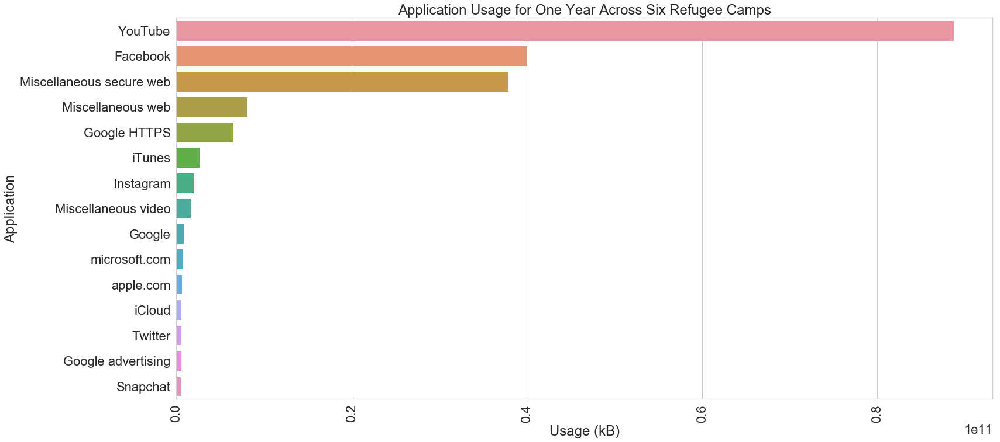

In [35]:
bar_top10(app_df)
plt.title("Application Usage for One Year Across Six Refugee Camps")

In [127]:
# bar_top10(moria_app)

In [128]:
# bar_top10(kos_app)

In [130]:
bar_top10(nea_app)

NameError: name 'nea_app' is not defined

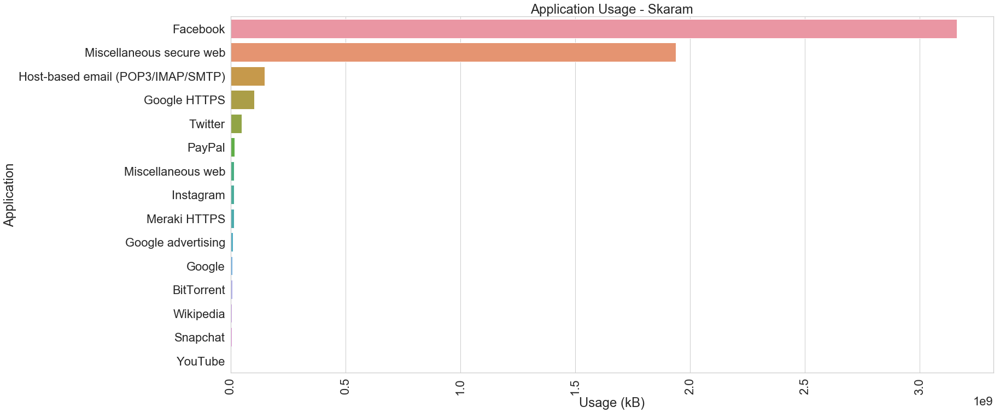

In [26]:
# bar_top10(skaram_app)

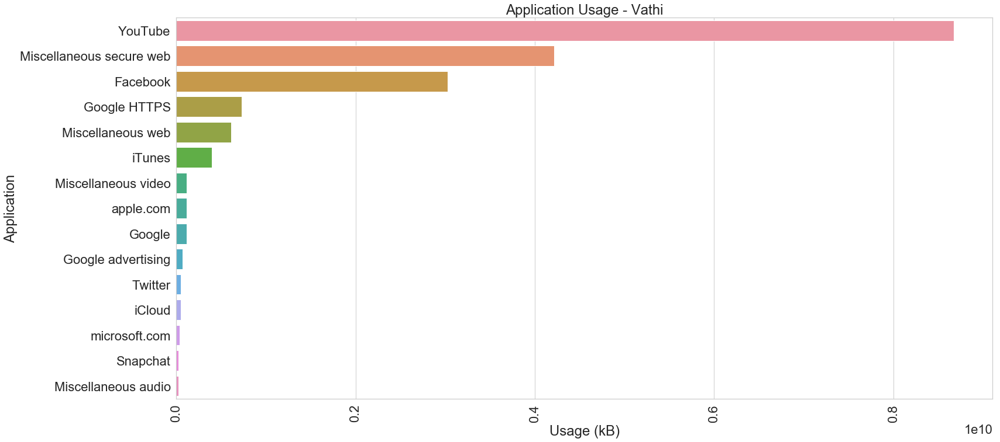

In [27]:
bar_top10(vathi_app)

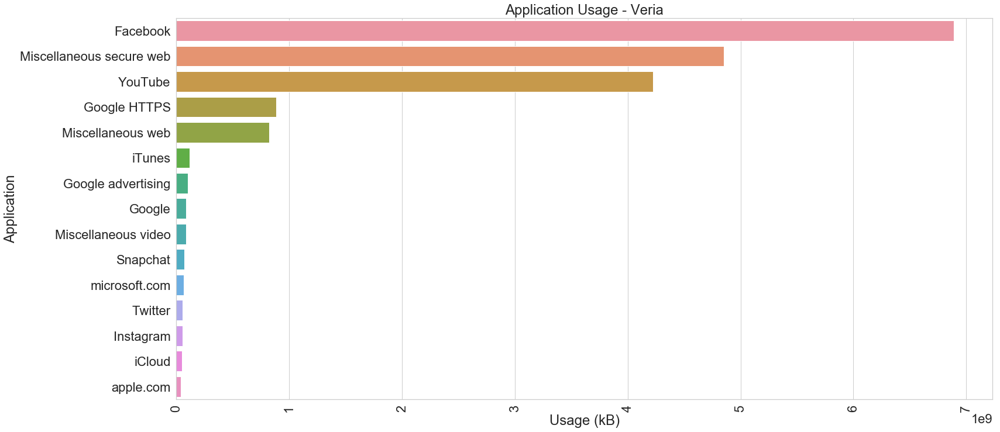

In [28]:
bar_top10(veria_app)

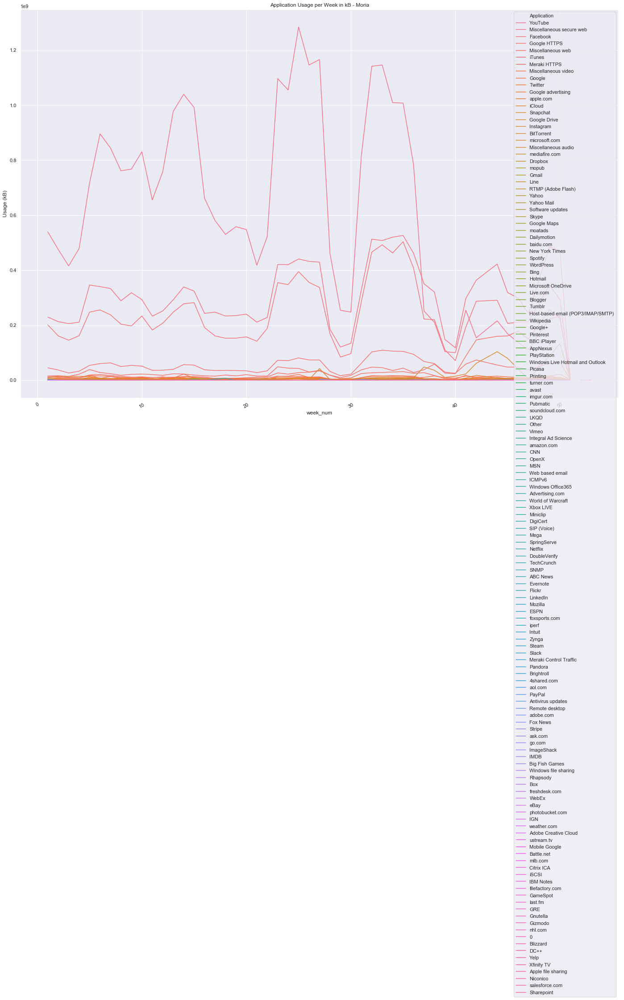

In [23]:
time_app_usage(moria_app)

In [113]:
time_app_usage(app_usage)

NameError: name 'time_app_usage' is not defined

In [ ]:
def time_app_usage(camp):
    sns.set(style="whitegrid")
    
    plt.figure(figsize=(24,16))
    ax = sns.lineplot(x="date", y='ActiveTime_hours', hue="Application", 
                 data=camp, err_style="bars")
    
#     ax.legend(loc='upper left', fontsize=10,bbox_to_anchor=(0, 1.1))
    ax.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize=20) #--legend
    ax.axes.set_title('Total Application Usage per Day in Hours - ' + camp['camp_name'].unique()[0],fontsize=35)
    ax.set_xlabel('Date',fontsize=25);
    ax.set_ylabel('Active Time in Hours',fontsize=25)
    ax.tick_params(labelsize=20)
    plt.xticks(rotation=20)

# 3. Web Protocol by camp

In [102]:
# app_usage['Application'].unique()

In [75]:
protocols = ['UDP','CDNs','Non-web TCP','ICMP','SSH','DNS','Real Time Streaming Protocol',
             'SOCKS proxy','Encrypted P2P','FTP', 'TCP', 'Encrypted TCP (SSL)']
protocol_df = app_usage[app_usage.Application.isin(protocols)]
protocol_df.head()

,Application,Usage (kB),% Usage,filename,camp_name,week_num
3,UDP,1.933805e+08,7.971832,Week26_Moria.xlsx,Moria,26
5,Non-web TCP,5.438900e+07,2.242108,Week26_Moria.xlsx,Moria,26
8,CDNs,2.297366e+07,0.947056,Week26_Moria.xlsx,Moria,26
14,ICMP,4.975039e+06,0.205089,Week26_Moria.xlsx,Moria,26
17,SSH,4.499291e+06,0.185477,Week26_Moria.xlsx,Moria,26


Text(0,0.5,'')

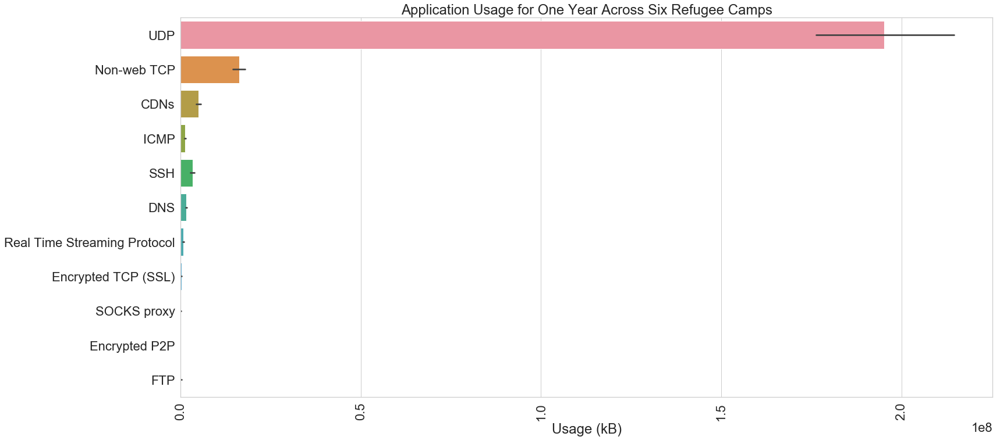

In [76]:
#     grouped = camp.groupby('Application').sum()
#     grouped = grouped.sort_values('Usage (kB)', ascending=False)
#     grouped = grouped[:15]
#     grouped = grouped.reset_index()


sns.set(style="whitegrid", font_scale = 2)
plt.figure(figsize=(25,12))
plt.title('Application Usage by Protocol')
sns.barplot(y='Application', x='Usage (kB)', 
             data=protocol_df, orient='h')
plt.xticks(rotation=90)
plt.title("Application Usage for One Year Across Six Refugee Camps")
plt.ylabel("")

In [77]:
moria_proto = protocol_df[protocol_df['camp_name']=='Moria']
kos_proto = protocol_df[protocol_df['camp_name']=='Kos']
nea_proto = protocol_df[protocol_df['camp_name']=='Nea']
skaram_proto = protocol_df[protocol_df['camp_name']=='Skaram']
vathi_proto = protocol_df[protocol_df['camp_name']=='Vathi']
veria_proto = protocol_df[protocol_df['camp_name']=='Veria']

In [78]:
def bar_proto(camp):
    sns.set(style="whitegrid", font_scale = 2)
    plt.figure(figsize=(25,12))
    plt.title('Application Protocol Usage - ' + camp['camp_name'].unique()[0])
    sns.barplot(y='Application', x='Usage (kB)', 
                 data=camp, orient='h')
    plt.xticks(rotation=90)

In [79]:
def time_proto(camp):
    plt.figure(figsize=(24,16))
    plt.title('Application Usage per Week in kB - ' + camp['camp_name'].unique()[0])
    sns.lineplot(x="week_num", y='Usage (kB)', hue="Application", 
                 data=camp)
    plt.xticks(rotation=30)

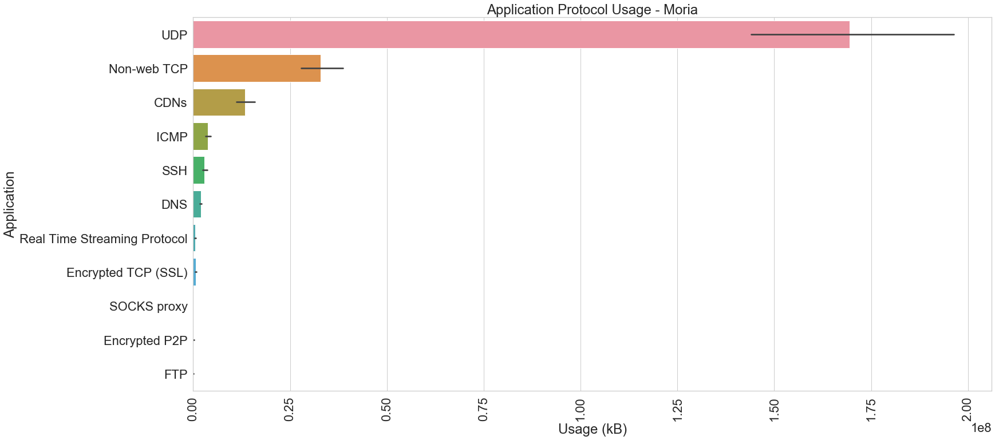

In [63]:
bar_proto(moria_proto)

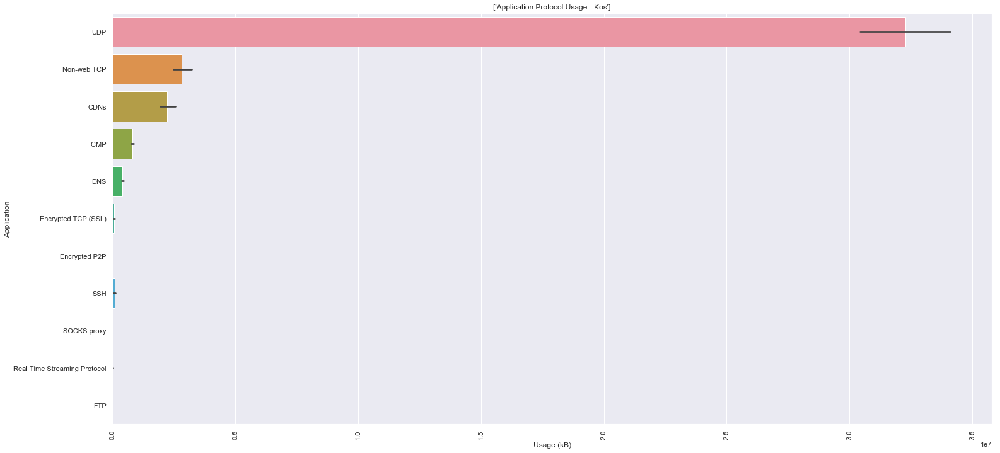

In [54]:
bar_proto(kos_proto)

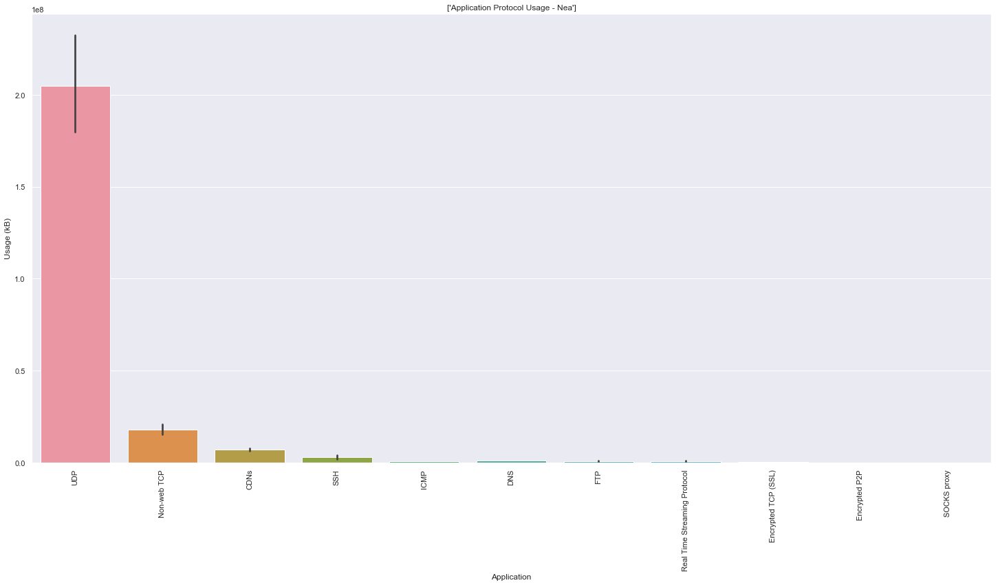

In [116]:
bar_proto(nea_proto)

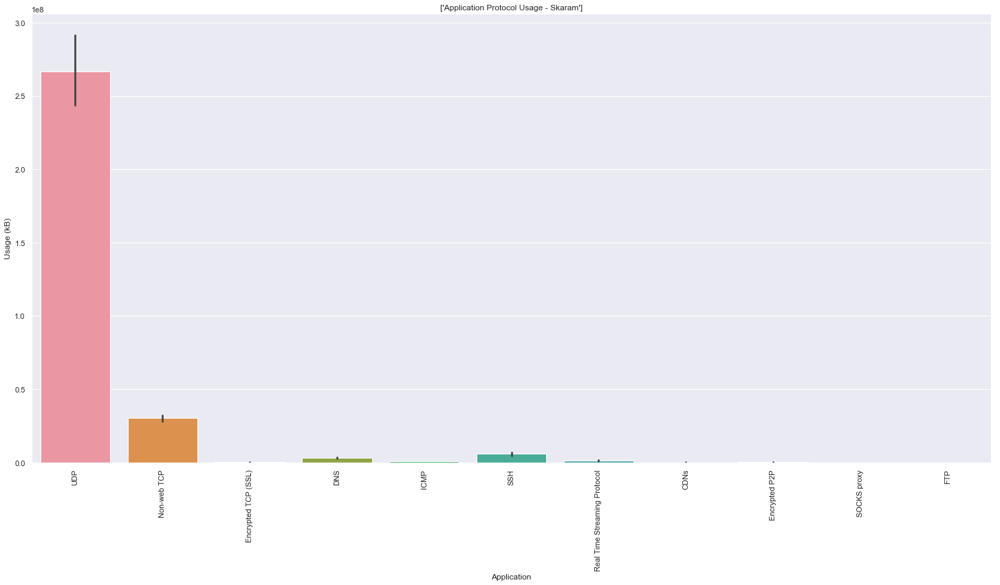

In [117]:
bar_proto(skaram_proto)

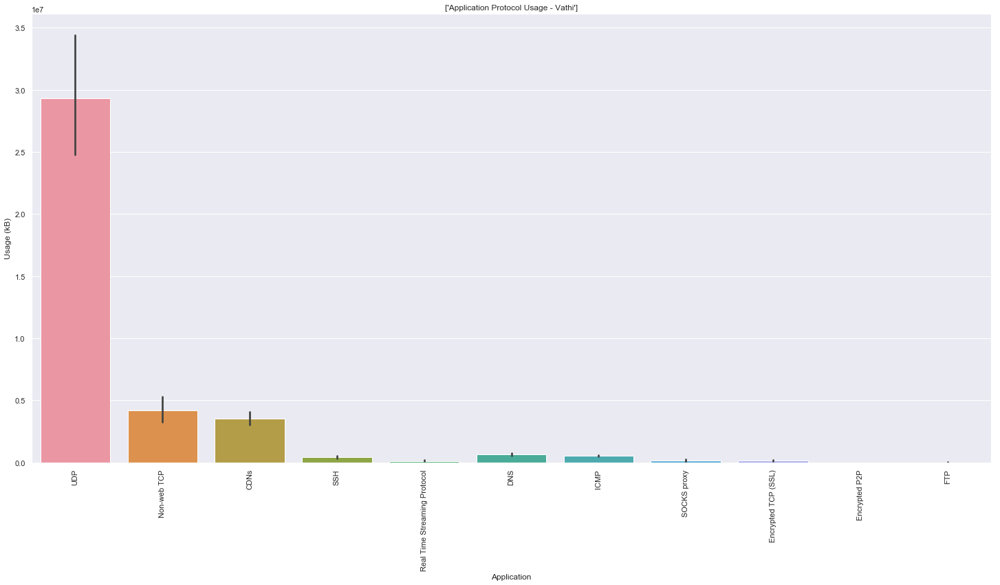

In [118]:
bar_proto(vathi_proto)

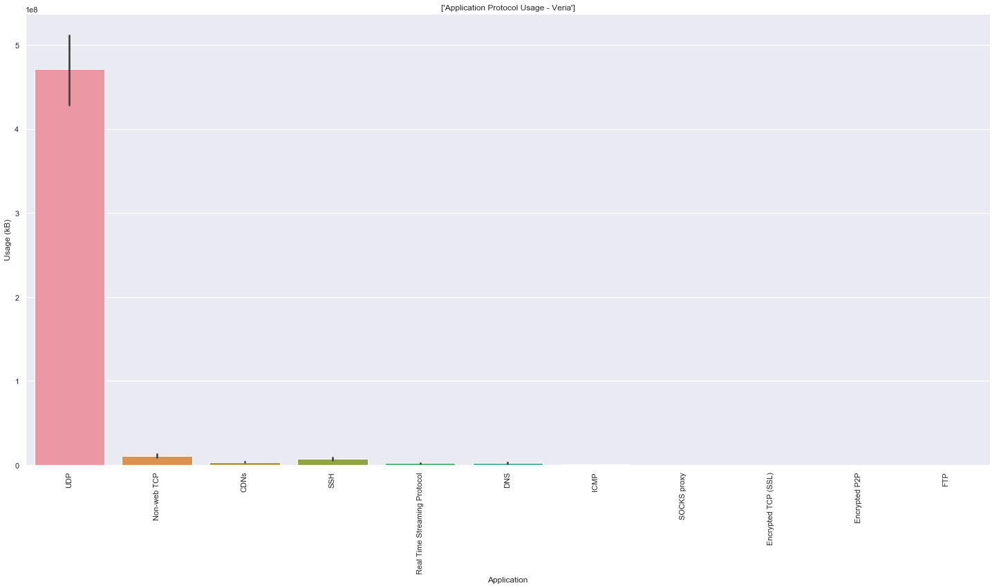

In [119]:
bar_proto(veria_proto)

Text(0.5,1,'Web Protocol Application Usage by Week for One Year Across Six Refugee Camps')

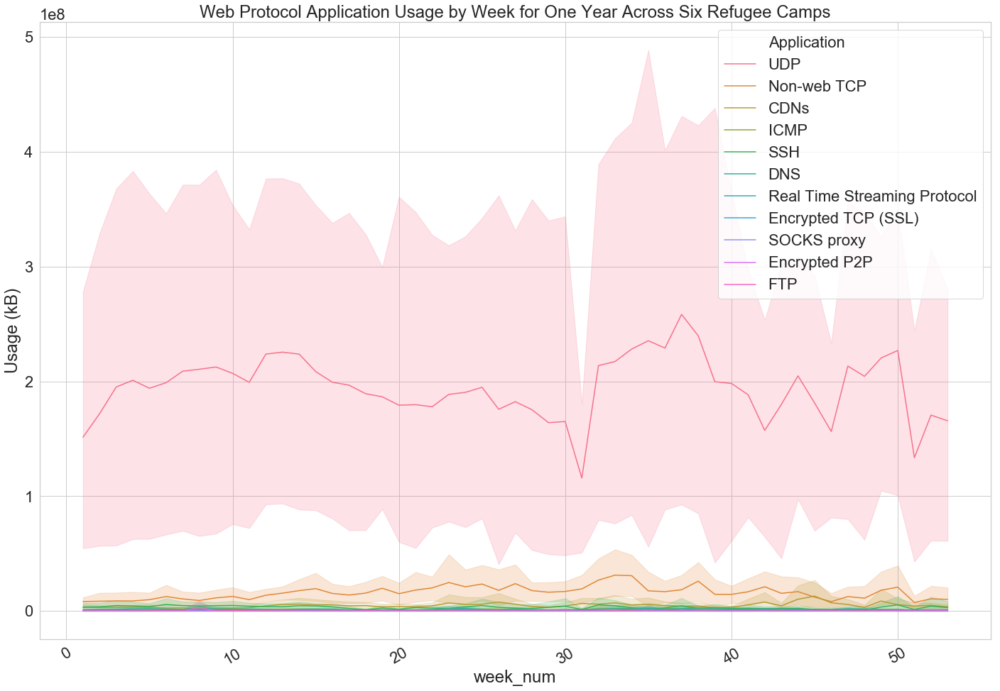

In [80]:
time_proto(protocol_df)
plt.title("Web Protocol Application Usage by Week for One Year Across Six Refugee Camps")

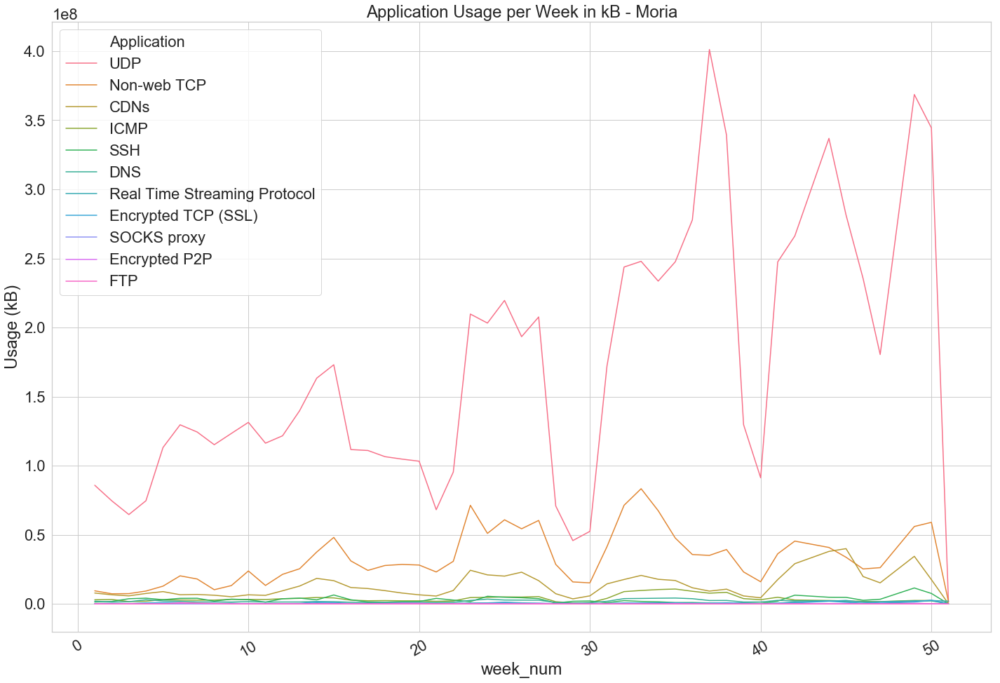

In [81]:
time_proto(moria_proto)

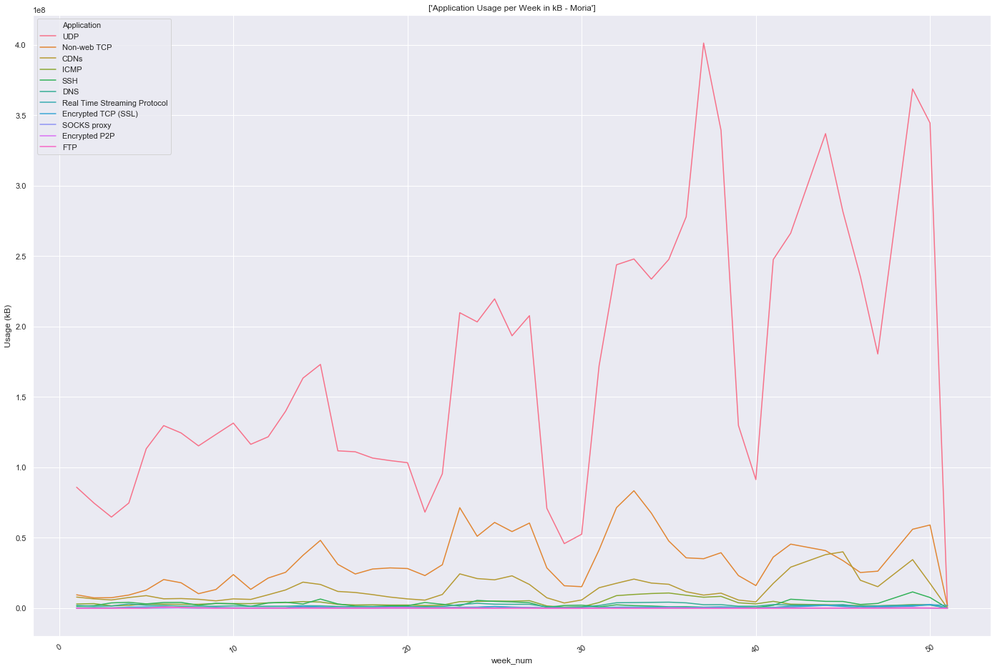

In [57]:
time_proto(moria_proto)

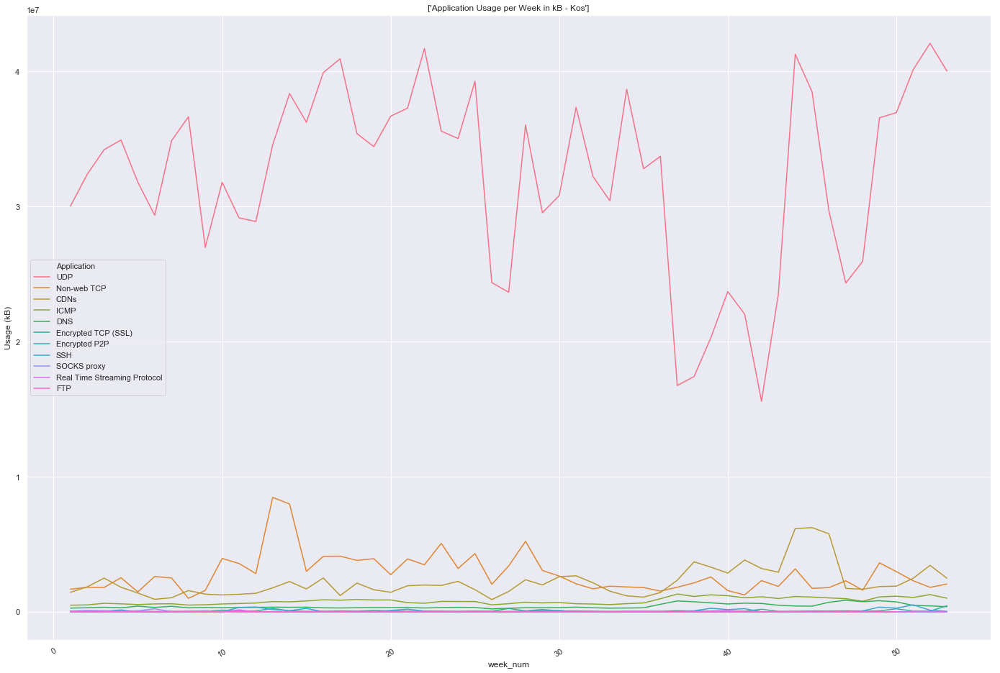

In [124]:
time_proto(kos_proto)

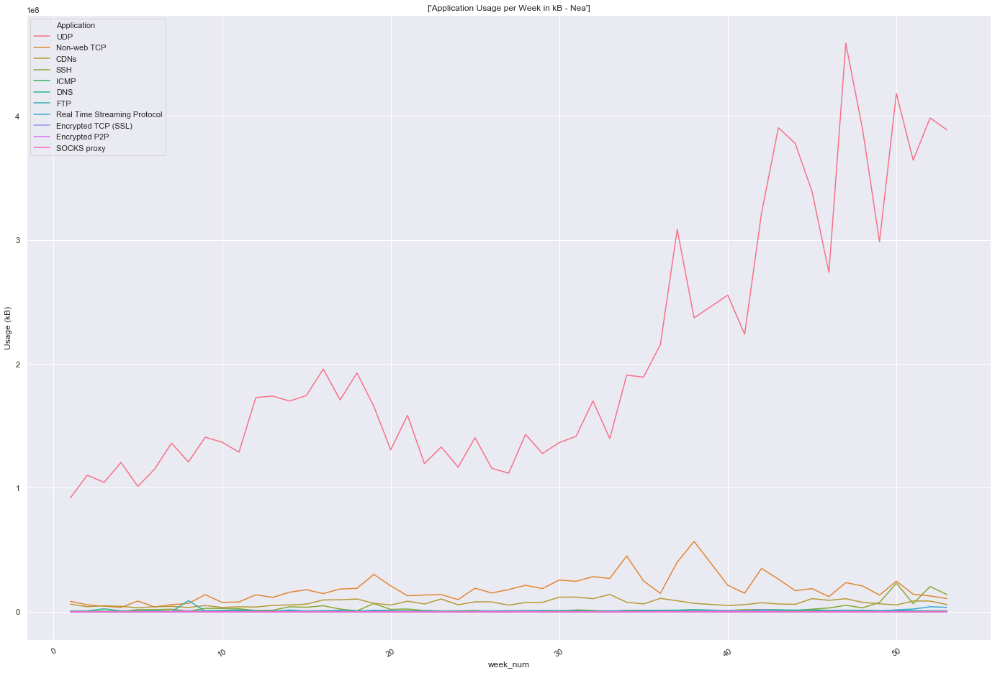

In [125]:
time_proto(nea_proto)

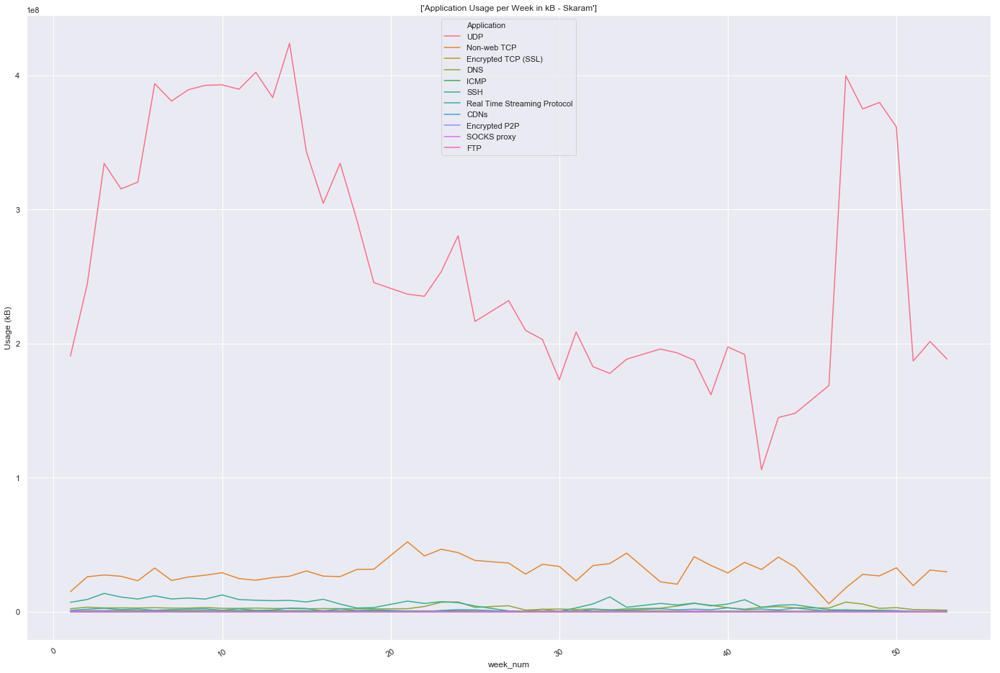

In [126]:
time_proto(skaram_proto)

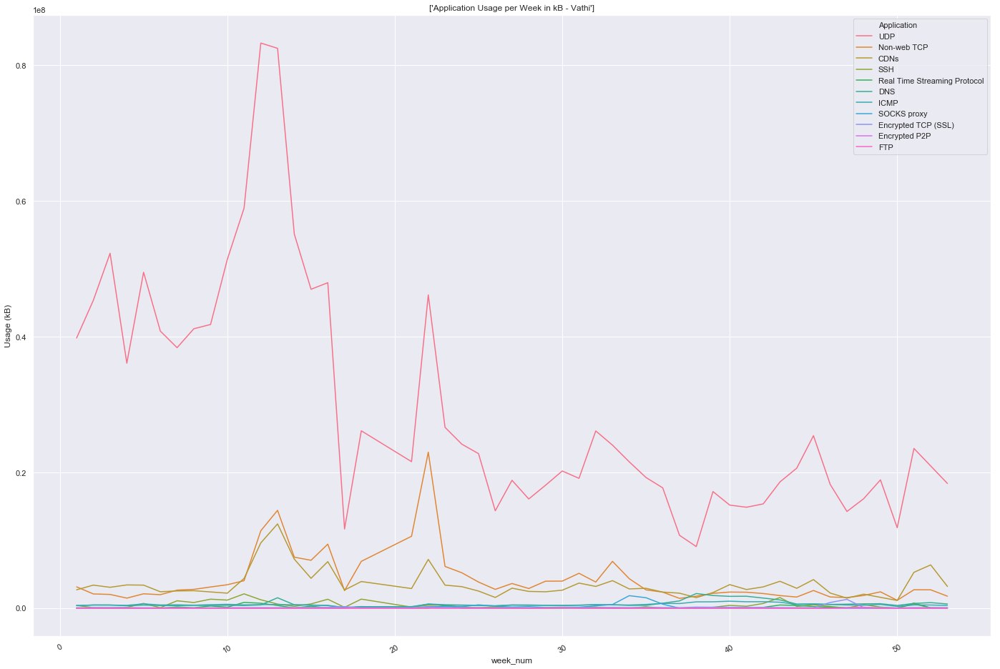

In [127]:
time_proto(vathi_proto)

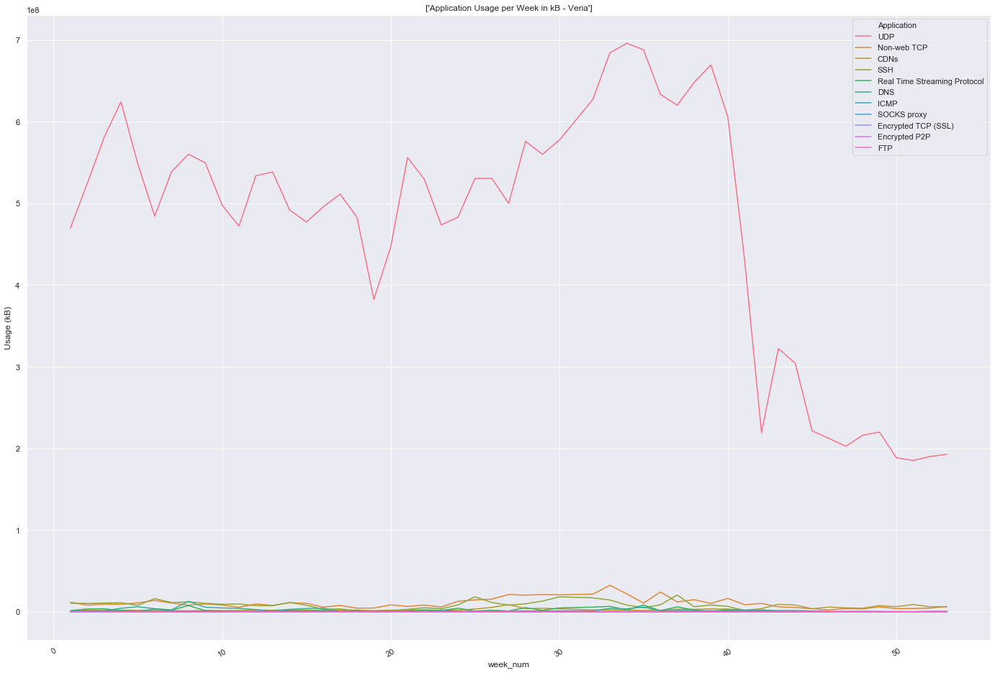

In [128]:
time_proto(veria_proto)

## Functions for visualizations

In [49]:
#--bar plot of usage per camp including all applications--
def bar_usage(camp):
    sns.set()
    plt.figure(figsize=(25,12))
    plt.title('Application Usage - ' + camp['camp_name'].unique())
    sns.barplot(x='Application', y='Usage (kB)', 
                 data=camp)
    plt.xticks(rotation=90)

In [89]:
#--barplot of usage per camp - top 15 applications-- 
def bar_top10(camp):
    grouped = camp.groupby('Application').sum()
    grouped = grouped.sort_values('Usage (kB)', ascending=False)
    grouped = grouped[:15]
    grouped = grouped.reset_index()
    
    sns.set()
    plt.figure(figsize=(25,12))
    plt.title('Application Usage - ' + camp['camp_name'].unique())
    sns.barplot(x='Application', y='Usage (kB)', data=grouped)
    plt.xticks(rotation=90)

In [47]:
#--Time Series for Application Usage per camp-- 
def time_app_usage(camp):
    sns.set()
    plt.figure(figsize=(24,16))
    plt.title('Application Usage per Week in kB - ' + camp['camp_name'].unique())
    sns.lineplot(x="week_num", y='Usage (kB)', hue="Application", 
                 data=camp)
    plt.xticks(rotation=30)

# 4. All Applications - Usage

## Visualizations Per Camp
- barplots
- time series

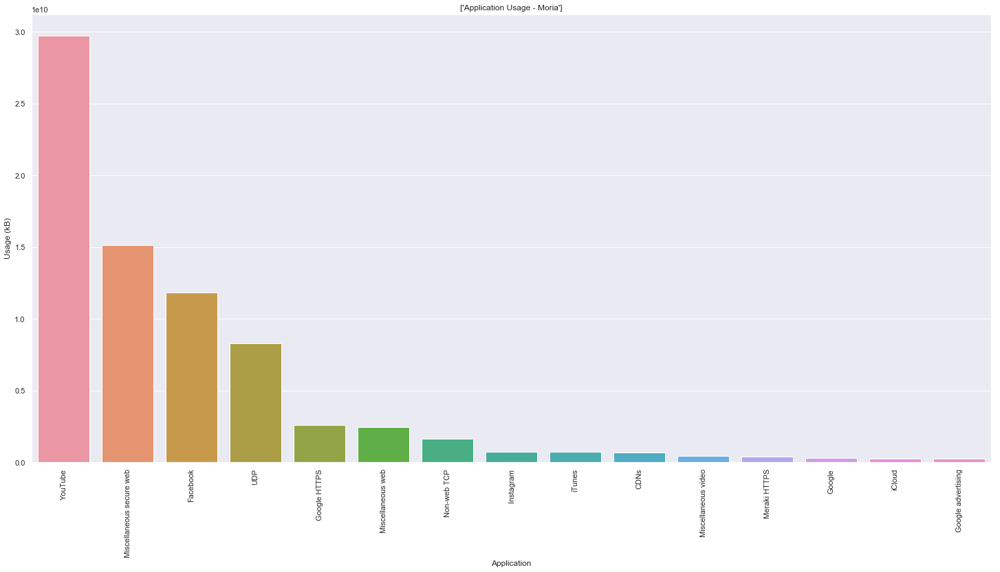

In [90]:
#--Tope 15 applications for MORIA - including protocols
bar_top10(moria)

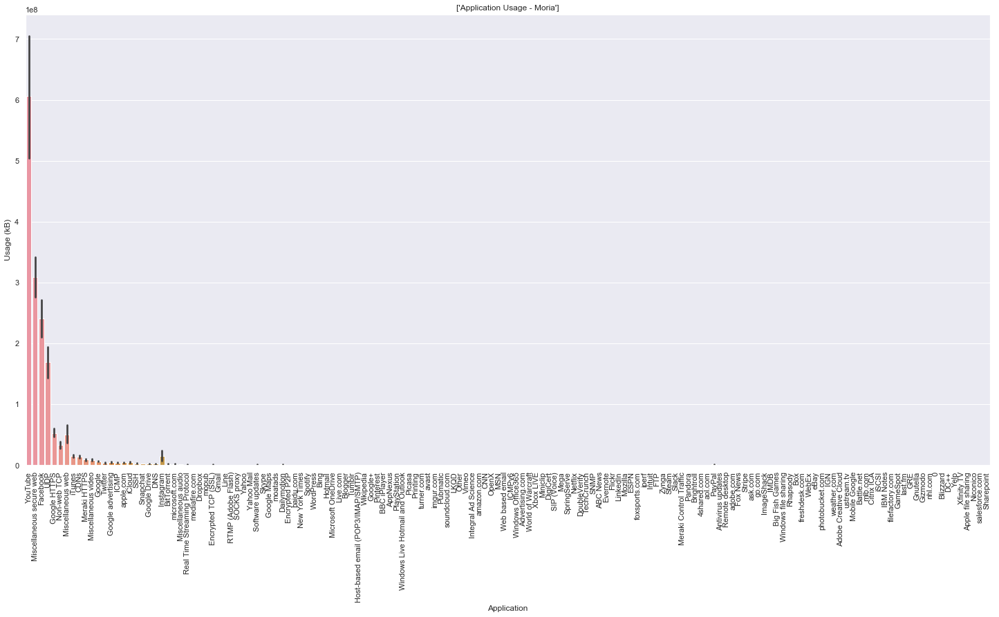

In [50]:
#--Moria bar plot for all applications
bar_usage(moria)

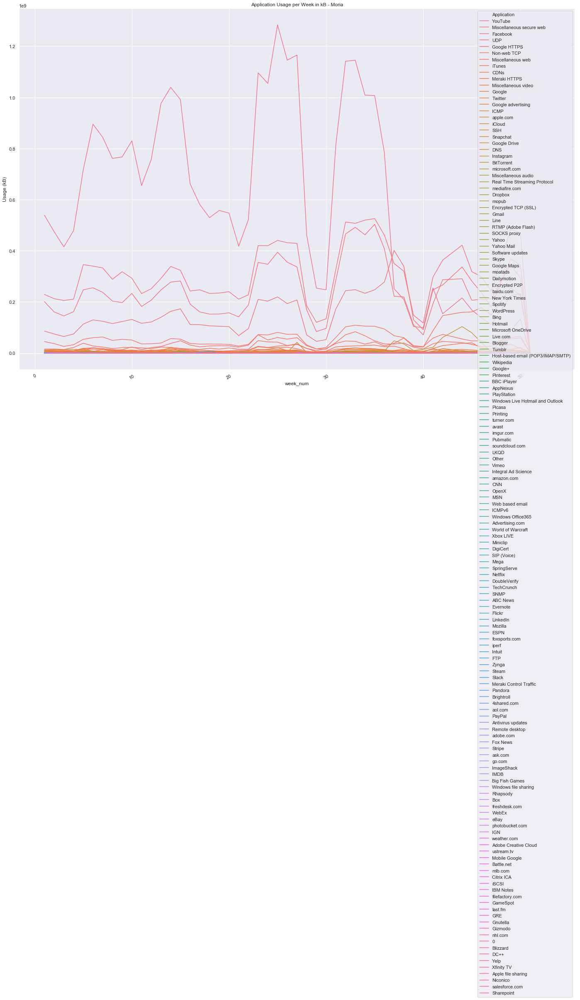

In [82]:
time_app_usage(moria)



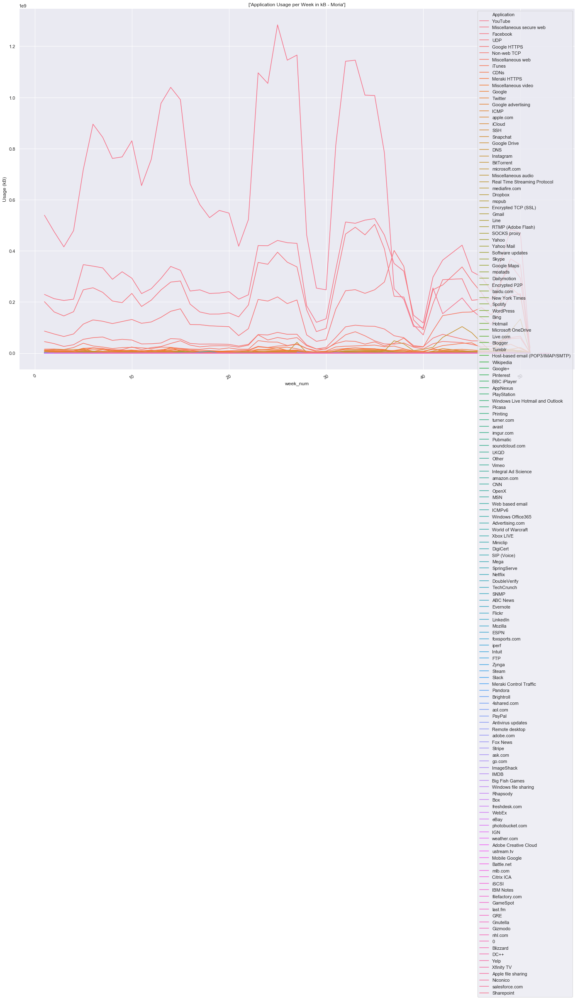

In [51]:
time_app_usage(moria)

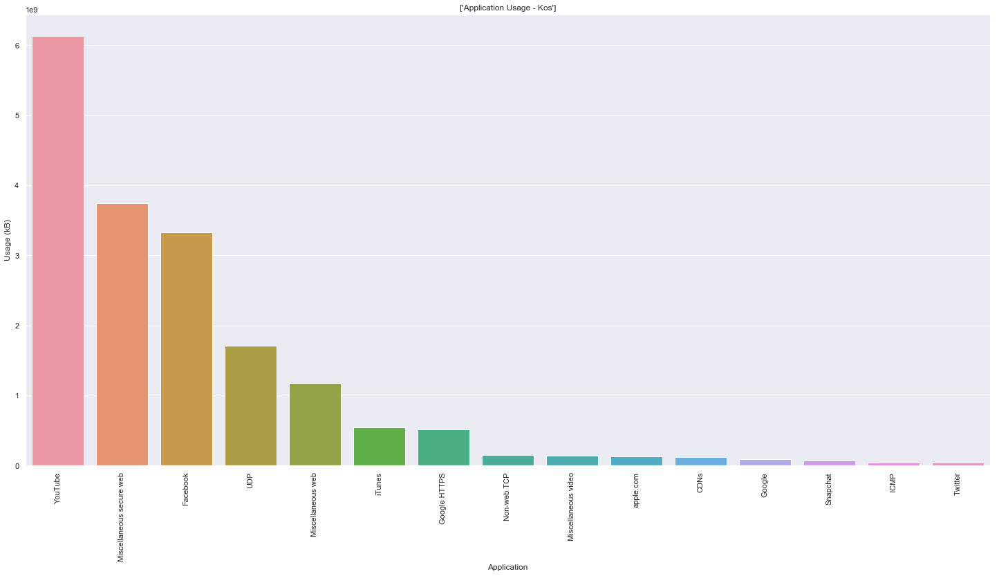

In [91]:
bar_top10(kos)

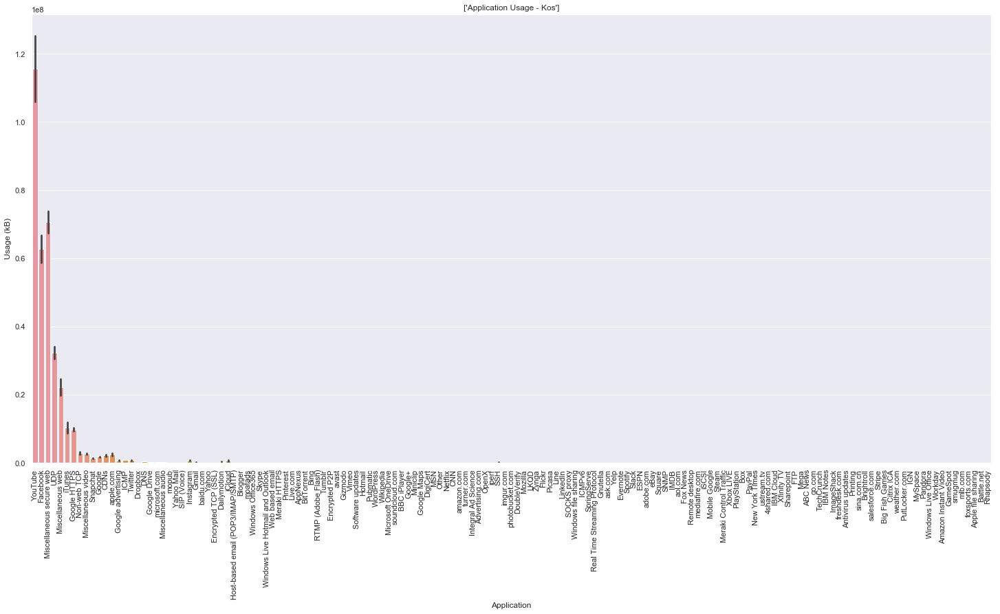

In [52]:
bar_usage(kos)

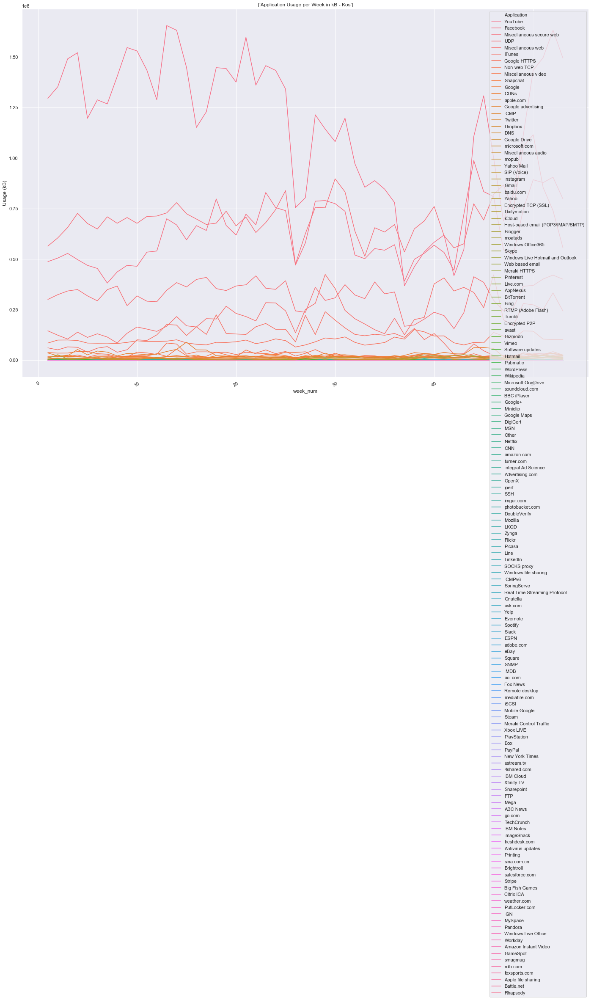

In [58]:
time_app_usage(kos)

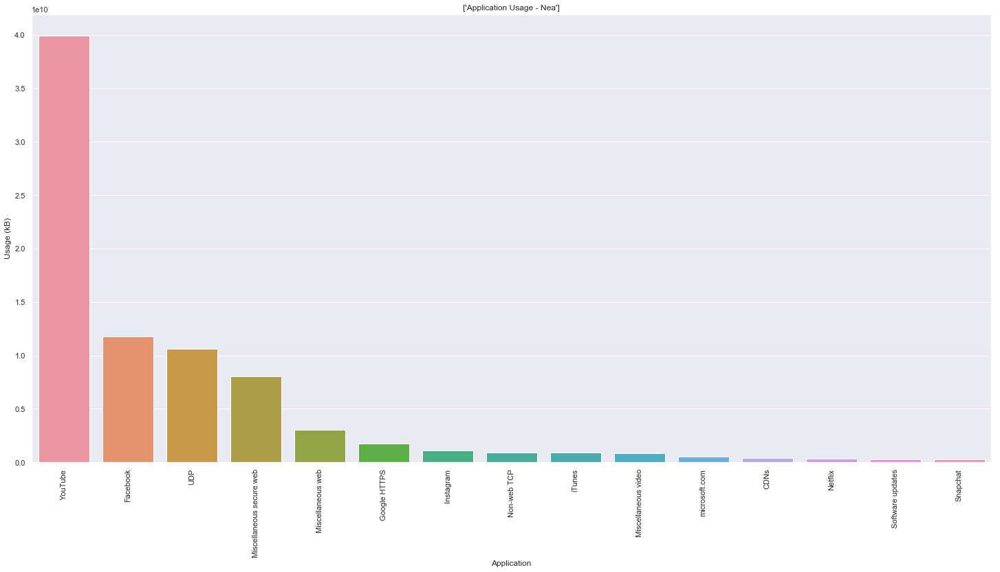

In [92]:
bar_top10(nea)

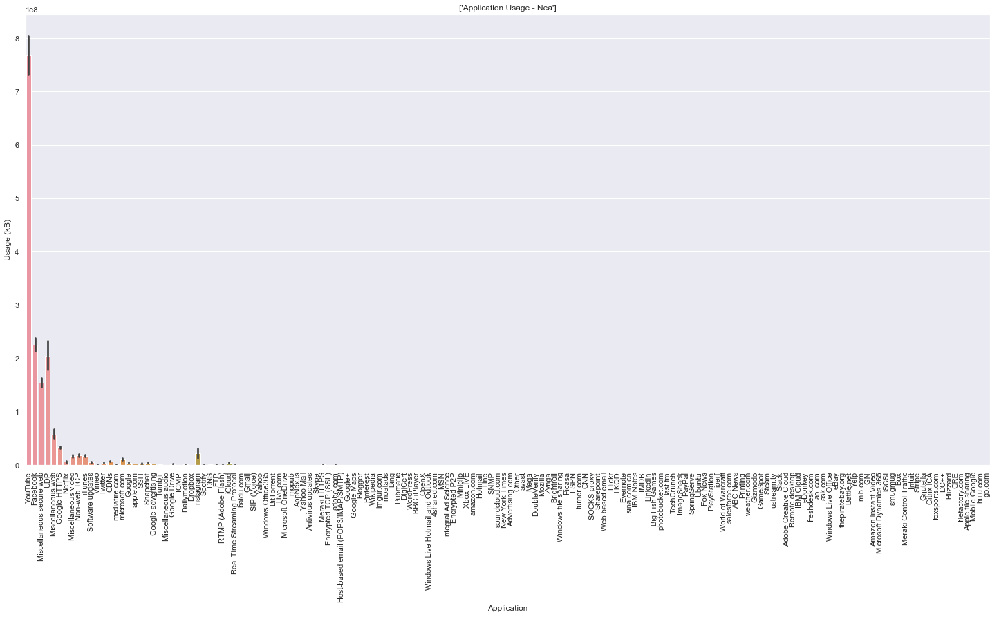

In [53]:
bar_usage(nea)

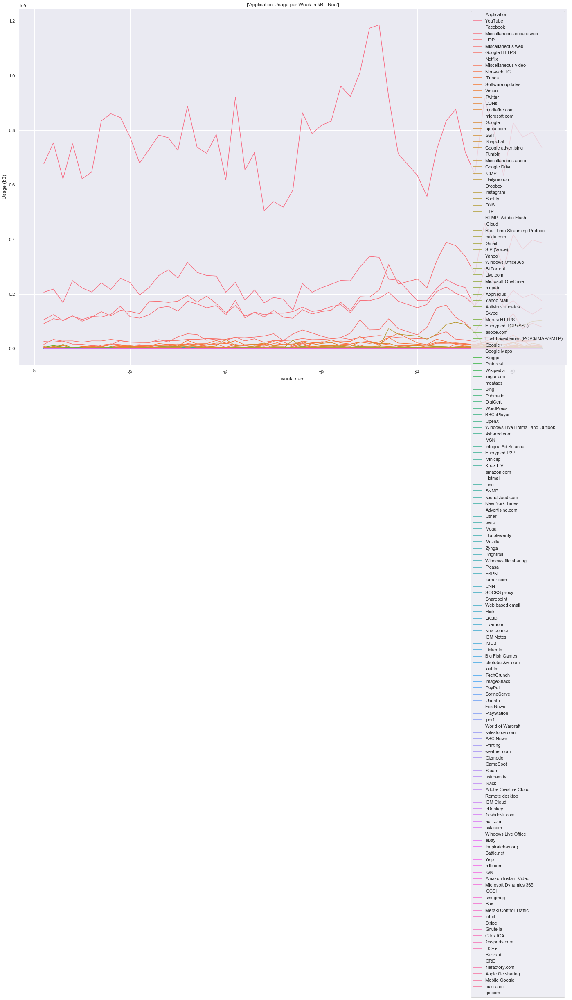

In [59]:
time_app_usage(nea)

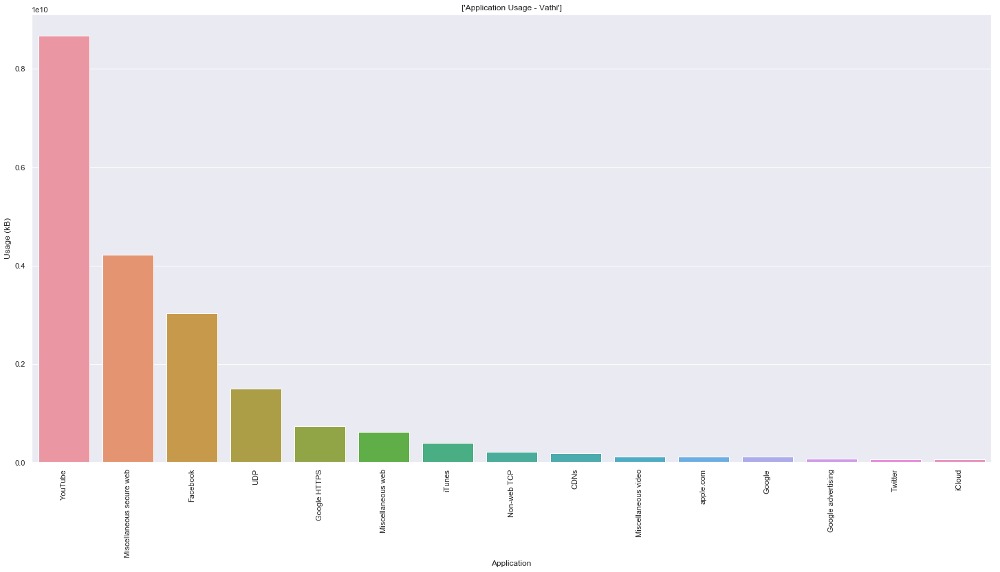

In [93]:
bar_top10(vathi)

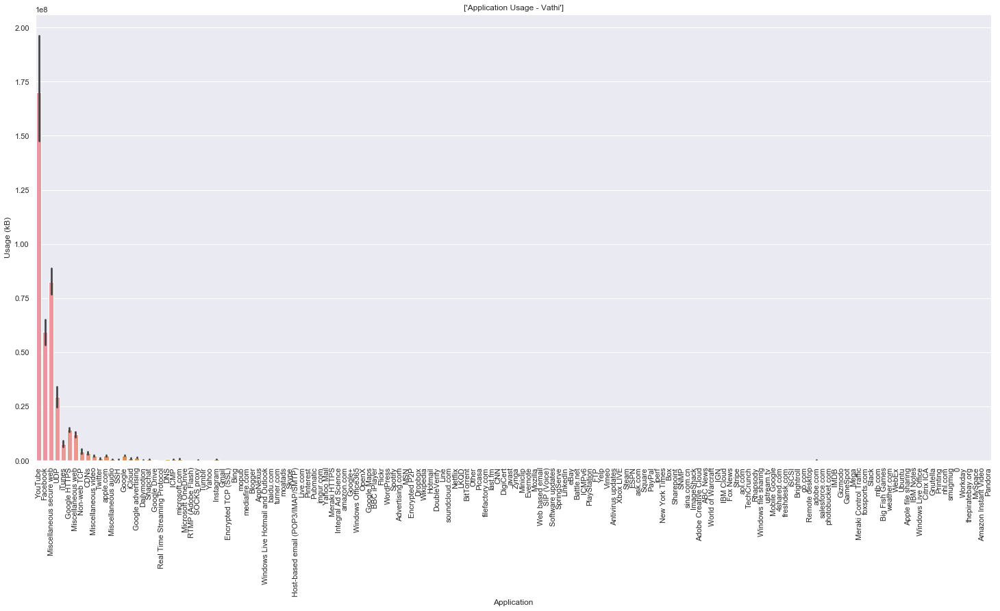

In [54]:
bar_usage(vathi)

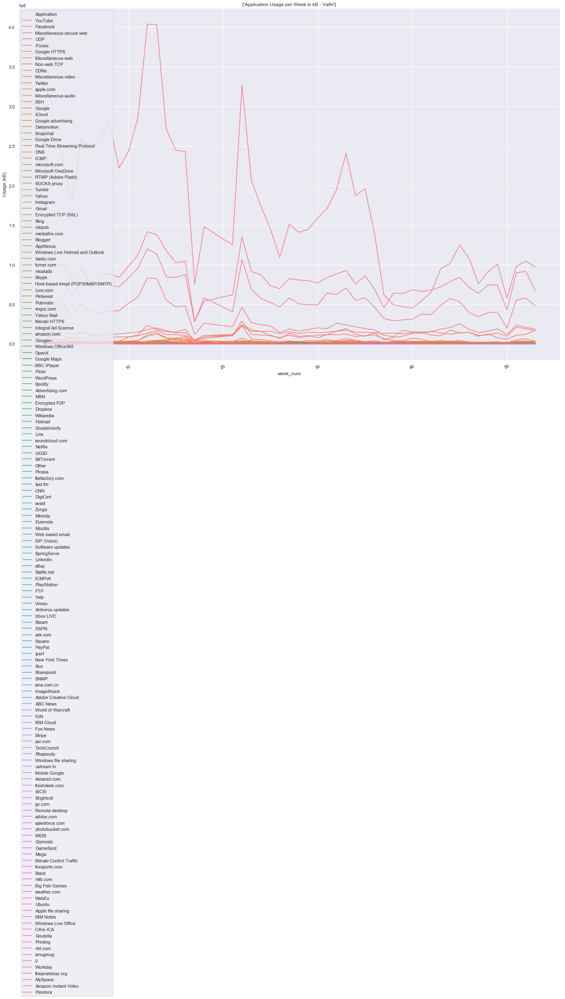

In [60]:
time_app_usage(vathi)

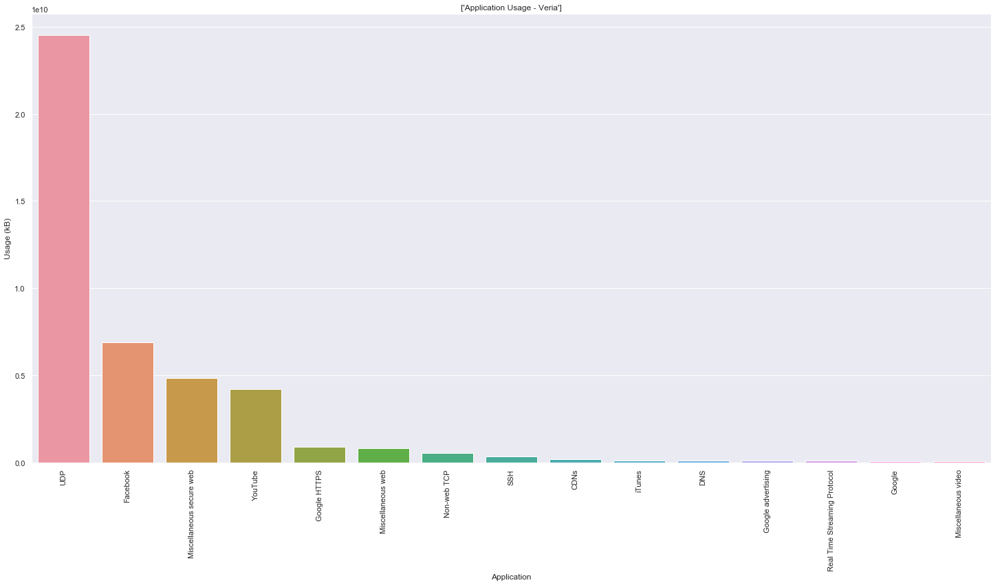

In [94]:
bar_top10(veria)

In [95]:
# bar_usage(veria)

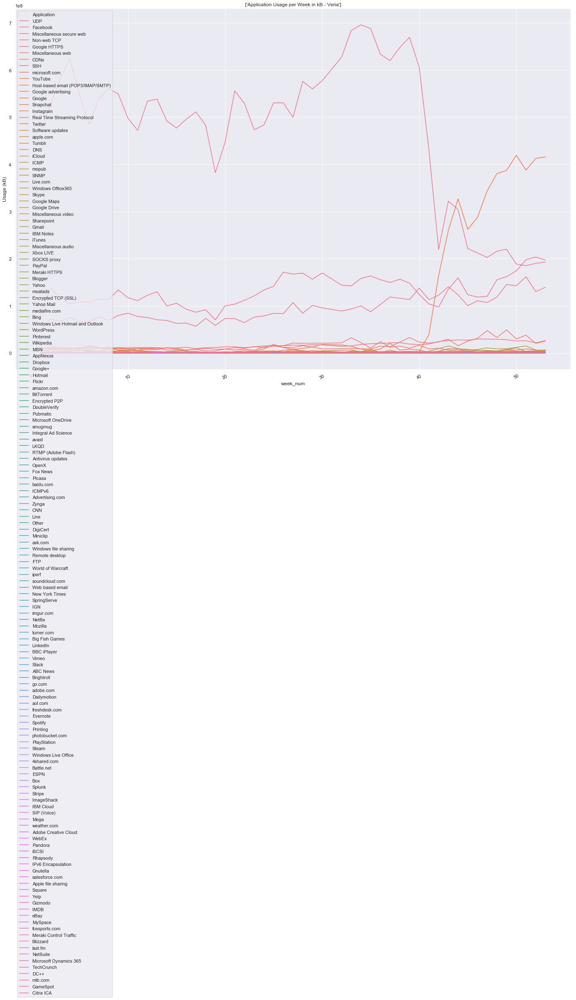

In [61]:
#--What does the spike represent?--

time_app_usage(veria)

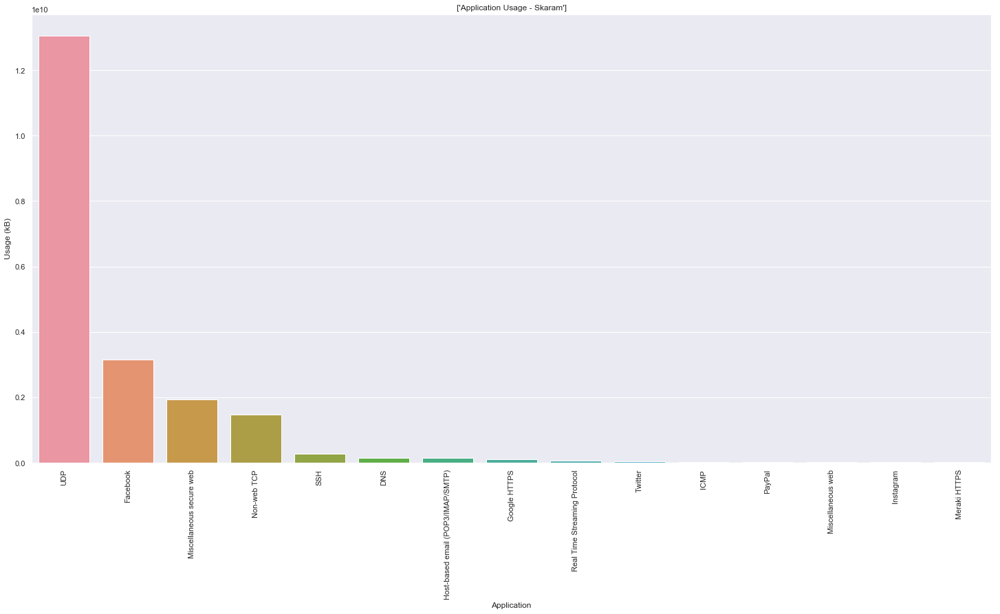

In [95]:
bar_top10(skaram)

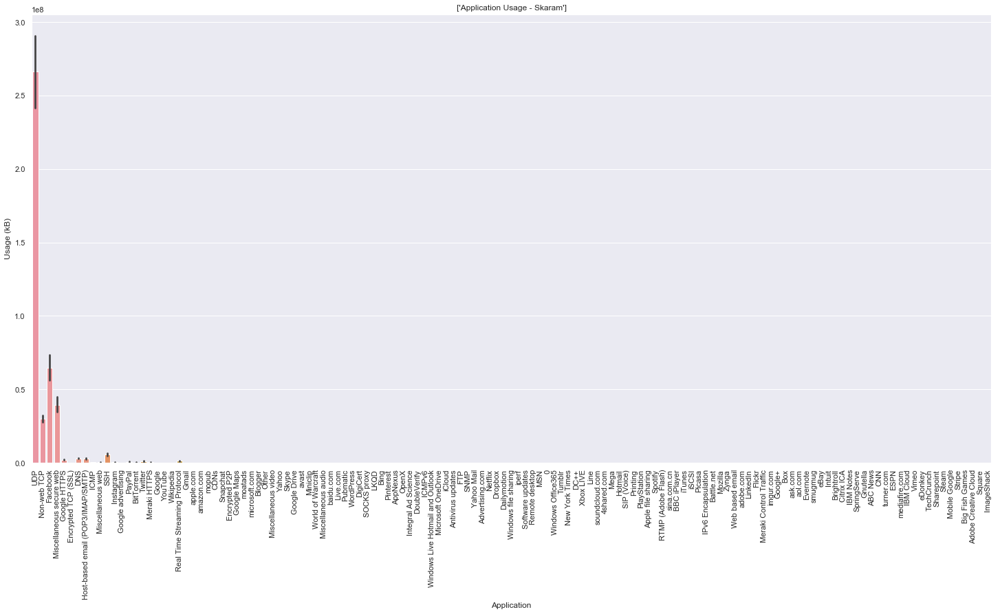

In [56]:
bar_usage(skaram)

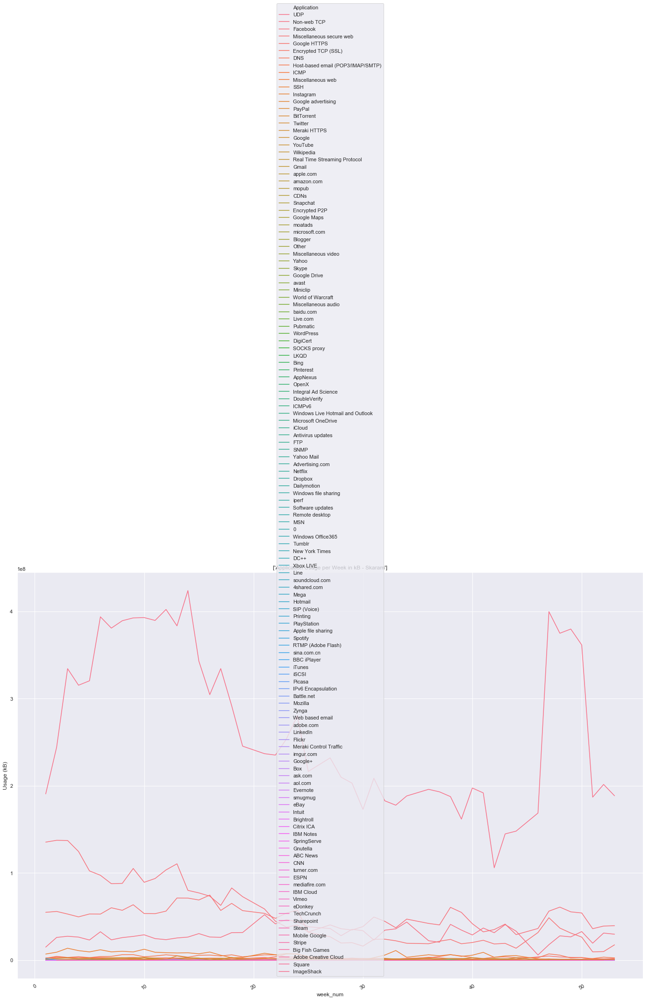

In [62]:
time_app_usage(skaram)

# 5. Social Networking Web Applications by Usage in (kB)

In [88]:
protocols = ['UDP','CDNs','Non-web TCP','ICMP','SSH','DNS','Real Time Streaming Protocol',
             'SOCKS proxy','Encrypted P2P','FTP', 'TCP', 'Encrypted TCP (SSL)']
social_df = app_usage[~app_usage.Application.isin(protocols)]

In [89]:
social_df.head(2)

,Application,Usage (kB),% Usage,filename,camp_name,week_num
0,YouTube,1.145481e+09,47.220819,Week26_Moria.xlsx,Moria,26
1,Miscellaneous secure web,4.316833e+08,17.795521,Week26_Moria.xlsx,Moria,26


In [91]:
moria_soc = social_df[social_df['camp_name']=='Moria']
kos_soc = social_df[social_df['camp_name']=='Kos']
nea_soc = social_df[social_df['camp_name']=='Nea']
skaram_soc = social_df[social_df['camp_name']=='Skaram']
vathi_soc = social_df[social_df['camp_name']=='Vathi']
veria_soc = social_df[social_df['camp_name']=='Veria']

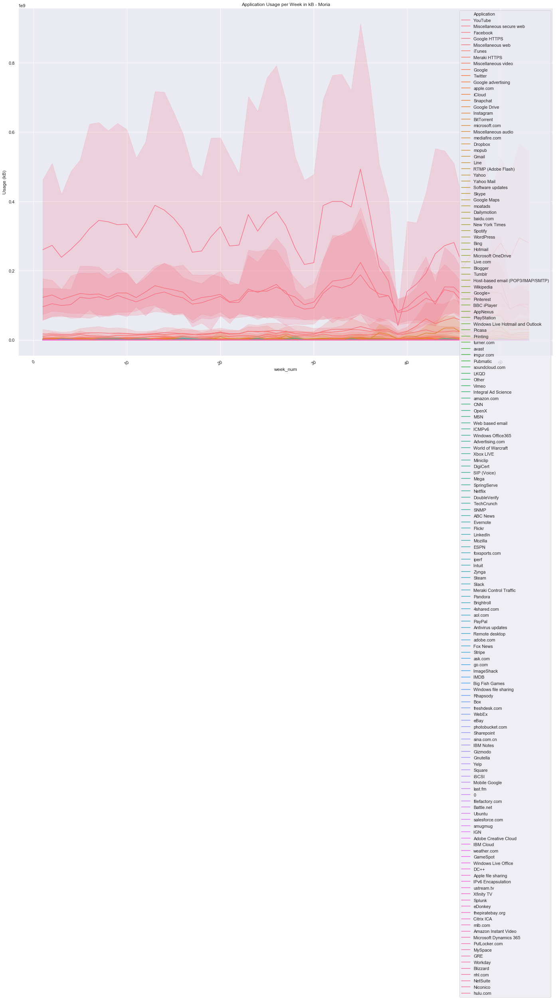

In [90]:
time_app_usage(social_df)

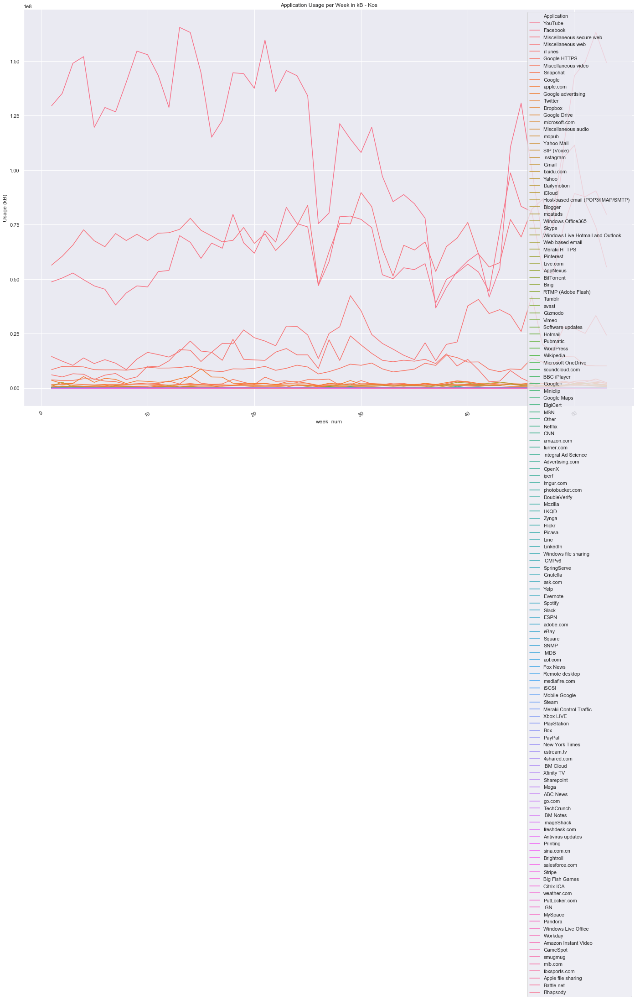

In [92]:
time_app_usage(kos_soc)


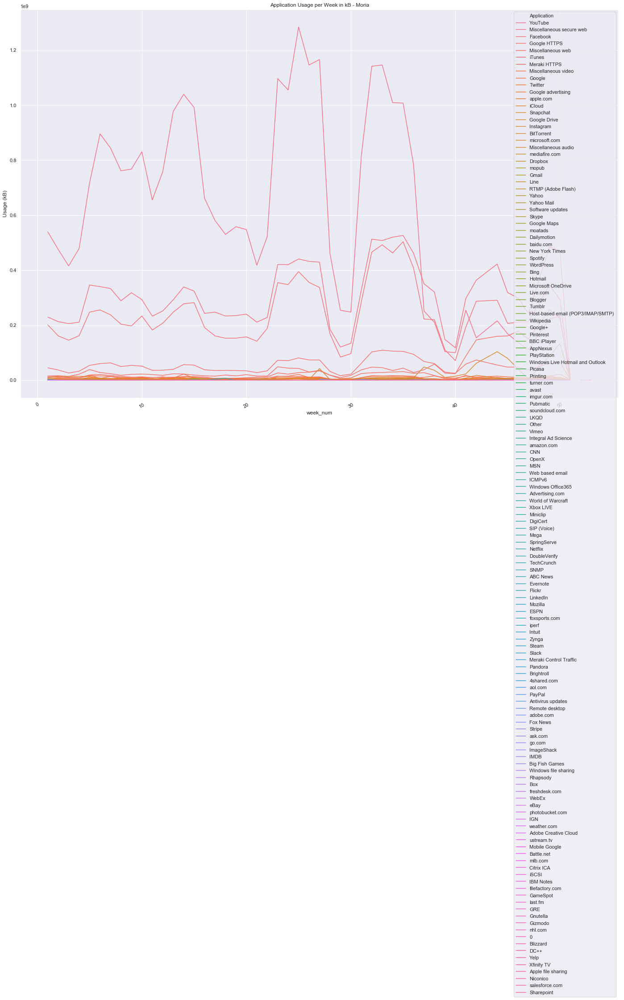

In [93]:
time_app_usage(moria_soc)

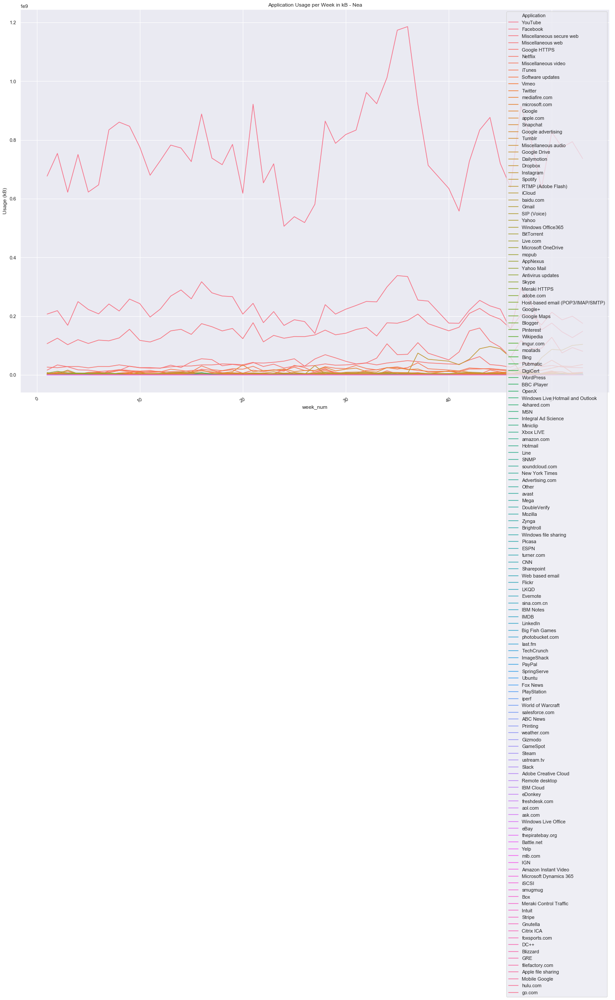

In [94]:
time_app_usage(nea_soc)

# II.  Application Categories (Weekly data spanning 1 year)

In [57]:
# gr_monthly_arrivals = pd.read_csv('Data/Greece_monthly_sea_and_land_arrivals')

### Add number of clients per week -- CAN'T DO THIS, THEY DON'T CORRELATE

In [89]:
#--Source: https://stackoverflow.com/questions/41857659/python-pandas-add-filename-column-csv
# import pandas as pd
# import glob
# import os

# globbed_files = glob.glob("Data/SummaryReports_byWeek/*.xlsx") #creates a list of all csv files

# data = [] # pd.concat takes a list of dataframes as an agrument
# for file in globbed_files:
#     try:
#         frame = pd.read_excel(file, sheet_name='Clients per day')
#         frame['filename'] = os.path.basename(file)
#         data.append(frame)
#     except:
#         frame['Time'] = 0
#         frame['# Clients'] = 0
#         frame['filename'] = os.path.basename(file)
#         print(os.path.basename(file))
#         data.append(frame)
        

# app_cat = pd.concat(data, ignore_index=True) #dont want pandas to try an align row indexes
# # bigframe.to_csv("Pandas_output2.csv")


# #--get filenames and create camp_name column--
# # list(app_usage[app_usage['filename'].unique()])
# # app_usage[app_usage['filename']]
# name_list = ['Moria', 'Nea', 'Vathi', 'Skaram', 'Kos', 'Veria']
    
# camp_list = list(app_cat['filename'].unique())
# s = '(' + '|'.join(name_list) + ')'
# app_cat['camp_name'] = app_cat['filename'].str.extract(s, expand=False)


# #--Add week number--
# week_lst = list(range(1,54))
# wk_lst = []
# for week in week_lst:
#     week = 'Week'+str(week)+'_'
#     wk_lst.append(week)

# #--Adding week_num column--
# weeks = list(app_cat['filename'].unique())
# m = '(' + '|'.join(wk_lst) + ')'

# app_cat['week_num'] = app_cat['filename'].str.extract(m, expand=False) 


# # #--Remove string values and convert to numeric
# app_cat['week_num'] = app_cat['week_num'].str.replace('Week','')
# app_cat['week_num'] = app_cat['week_num'].str.replace('_','')
# app_cat['week_num'] = pd.to_numeric(app_cat['week_num'])

In [90]:
# app_cat[app_cat.camp_name == 'Moria' & ]

In [91]:
# cat_client_per_week = app_cat.groupby(['filename','camp_name', 'week_num']).sum().reset_index()
# cat_client_per_week

### Create Dataframe for Application Usage per Week

In [346]:
#--Source: https://stackoverflow.com/questions/41857659/python-pandas-add-filename-column-csv
import pandas as pd
import glob
import os

globbed_files = glob.glob("Data/SummaryReports_byWeek/*.xlsx") #creates a list of all csv files

data = [] # pd.concat takes a list of dataframes as an agrument
for file in globbed_files:
    try:
        frame = pd.read_excel(file, sheet_name='Top application categories')
        frame['filename'] = os.path.basename(file)
        data.append(frame)
    except:
        frame['Category'] = 0
        frame['Usage (kB)'] = 0
        frame['% Usage'] = 0
        frame['filename'] = os.path.basename(file)
        print(os.path.basename(file))
        data.append(frame)
        

app_category = pd.concat(data, ignore_index=True) #dont want pandas to try an align row indexes
# bigframe.to_csv("Pandas_output2.csv")

Week45_Skaram.xlsx
Week52_Moria.xlsx
Week20_VathiS.xlsx
Week19_VathiS.xlsx
Week53_Moria.xlsx


In [347]:
#--get filenames and create camp_name column--
# list(app_usage[app_usage['filename'].unique()])
# app_usage[app_usage['filename']]
name_list = ['Moria', 'Nea', 'Vathi', 'Skaram', 'Kos', 'Veria']
    
camp_list = list(app_category['filename'].unique())
s = '(' + '|'.join(name_list) + ')'
app_category['camp_name'] = app_category['filename'].str.extract(s, expand=False)

In [348]:
#--Add week number--
week_lst = list(range(1,54))
wk_lst = []
for week in week_lst:
    week = 'Week'+str(week)+'_'
    wk_lst.append(week)

#--Adding week_num column--
weeks = list(app_category['filename'].unique())
m = '(' + '|'.join(wk_lst) + ')'

app_category['week_num'] = app_category['filename'].str.extract(m, expand=False) 


# #--Remove string values and convert to numeric
app_category['week_num'] = app_category['week_num'].str.replace('Week','')
app_category['week_num'] = app_category['week_num'].str.replace('_','')
app_category['week_num'] = pd.to_numeric(app_category['week_num'])


#--Find daily usage for each application--
app_category['avg_usage_per_day_kb'] = app_category['Usage (kB)'].div(7) #--CANT DO THIS---

#--Rename Usage (kB)
app_category['total_usage_per_week_kb'] = app_category['Usage (kB)']

#--Merge client numbers per week--
# app_categ = pd.merge(m[['# Clients', 'filename']], app_category, on='filename')

In [349]:
len(app_category)

6467

In [97]:
# app_category = pd.merge(cat_client_per_week[['# Clients', 'filename']], app_category, on='filename')
# app_category

In [88]:
#--Add usage per 
# app_category['usage_per_week_per_client'] = app_category['usage_per_week_kb'].div(app_category['# Clients'])

# app_category['usage_per_day_per_client'] = app_category['usage_per_week_per_client'].div(7)

In [350]:
app_category

,Category,Usage (kB),% Usage,filename,camp_name,week_num,avg_usage_per_day_kb,total_usage_per_week_kb
0,Video,1.155509e+09,4.763419e+01,Week26_Moria.xlsx,Moria,26,1.650727e+08,1.155509e+09
1,Other,8.511418e+08,3.508709e+01,Week26_Moria.xlsx,Moria,26,1.215917e+08,8.511418e+08
2,Social web,3.710651e+08,1.529662e+01,Week26_Moria.xlsx,Moria,26,5.300930e+07,3.710651e+08
3,Music,3.043476e+07,1.254629e+00,Week26_Moria.xlsx,Moria,26,4.347823e+06,3.043476e+07
4,Advertising,8.506253e+06,3.506580e-01,Week26_Moria.xlsx,Moria,26,1.215179e+06,8.506253e+06
5,Online backup,4.710905e+06,1.942003e-01,Week26_Moria.xlsx,Moria,26,6.729865e+05,4.710905e+06
6,P2P,1.550022e+06,6.389740e-02,Week26_Moria.xlsx,Moria,26,2.214317e+05,1.550022e+06
7,File sharing,7.809567e+05,3.219381e-02,Week26_Moria.xlsx,Moria,26,1.115652e+05,7.809567e+05
8,Email,7.450022e+05,3.071164e-02,Week26_Moria.xlsx,Moria,26,1.064289e+05,7.450022e+05
9,Web file sharing,7.402341e+05,3.051508e-02,Week26_Moria.xlsx,Moria,26,1.057477e+05,7.402341e+05


In [353]:
totals_cat = app_category.groupby(by = 'Category').sum()

totals_cat.sort_values(by=['Usage (kB)'], ascending=False)

,Usage (kB),% Usage,week_num,avg_usage_per_day_kb,total_usage_per_week_kb
Category,,,,,
Other,1.240570e+11,16089.832544,8155,1.772242e+10,1.240570e+11
Video,9.082036e+10,8810.615018,8155,1.297434e+10,9.082036e+10
Social web,4.312559e+10,5037.428211,8155,6.160799e+09,4.312559e+10
Music,2.852279e+09,394.720491,7990,4.074684e+08,2.852279e+09
Advertising,6.740599e+08,77.447846,8150,9.629427e+07,6.740599e+08
Online backup,6.160251e+08,61.696733,7917,8.800359e+07,6.160251e+08
Software & anti-virus updates,3.648564e+08,30.072191,8102,5.212235e+07,3.648564e+08
Email,2.629959e+08,49.613008,8155,3.757085e+07,2.629959e+08
P2P,1.228465e+08,10.804657,8155,1.754950e+07,1.228465e+08


## --Create .CSV for Application Category Usage per Week (53 weeks)--

In [105]:
#--Create .csv file for app category data--
app_category.to_csv('53_weeks_application_Category_usage2.csv')

In [57]:
app_category.columns

Index(['Category', 'Usage (kB)', '% Usage', 'filename', 'camp_name',
       'week_num', 'usage_per_day_kb', 'usage_per_week_kb'],
      dtype='object')

In [116]:
app_category['Category'].unique()

array(['Video', 'Social web', 'Music', 'Advertising', 'Online backup',
       'P2P', 'File sharing', 'Email', 'Web file sharing',
       'Software & anti-virus updates', 'VoIP & video conferencing',
       'News', 'Blogging', 'Photo sharing', 'Gaming', 'Security',
       'Productivity', 'Sports', 'Web payments', 'Cloud services',
       'Remote monitoring & management', 'Business management', 0],
      dtype=object)

In [117]:
kos_cat = app_category[app_category['camp_name']=='Kos']
moria_cat = app_category[app_category['camp_name']=='Moria']
nea_cat = app_category[app_category['camp_name']=='Nea']
skaram_cat = app_category[app_category['camp_name']=='Skaram']
vathi_cat = app_category[app_category['camp_name']=='Vathi']
veria_cat = app_category[app_category['camp_name']=='Veria']

In [383]:
#--bar plot for application categories--
def bar_plot(camp):
    sns.set(style="whitegrid", font_scale = 2)
    plt.figure(figsize=(25,12))
    plt.title('Application Category Distribution for a Year')
#     sns.barplot(x='Category', y='Usage (kB)',data=camp)
    sns.barplot(y='Category', x='Usage (kB)',data=camp, orient='h')
    plt.xticks(rotation=90)

In [125]:
def barplot2(camp):
    
    sns.set(style="whitegrid", font_scale = 2)
    plt.figure(figsize=(25,12))
#     plt.title('Application Category Distribution - Data for One Year')
    plt.title('Application Category Distribution - Data for One Year: ' + camp['camp_name'].unique()[0], fontsize=30)
    sns.barplot(y='Category', x='Usage (kB)', data=camp, orient='h', color='b')
    plt.xticks(rotation=90)
    plt.ylabel("")
    
    
#     sns.set(style="whitegrid", font_scale = 2)
#     plt.figure(figsize=(25,12))
#     plt.title('Total Application Usage in Hours Over One Week - ' + camp['camp_name'].unique()[0], fontsize=30)
#     sns.barplot(y='Application', x='ActiveTime_hours', data=camp, orient='h', color='b')

#     plt.xlabel("Total Active Time in Hours")
#     plt.ylabel("")  

In [381]:
def cat_time(camp):
    sns.set()
    plt.figure(figsize=(24,16))
    plt.title('Weekly Application Categories 1/1/18 - 1/1/19')
    sns.lineplot(x="week_num", y='Usage (kB)', hue="Category", 
                 data=camp)
    plt.xticks(rotation=30)

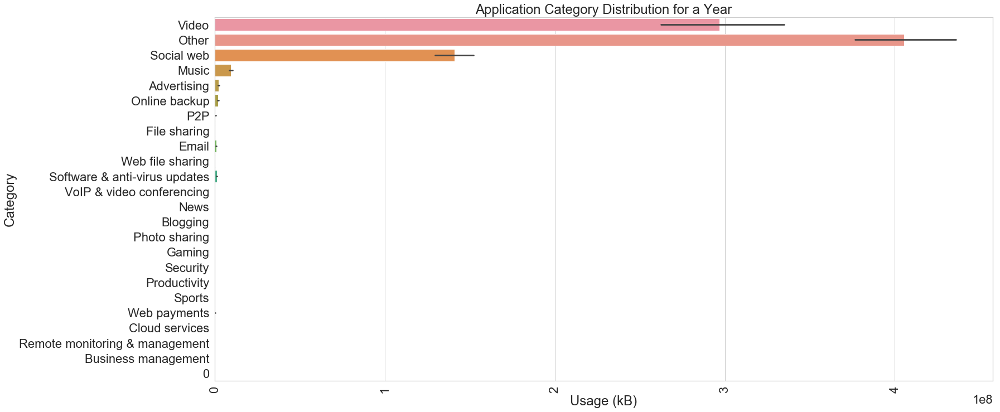

In [384]:
bar_plot(app_category)

Text(0.5,1,'Application Category Distribution - Data for One Year Across Six Camps')

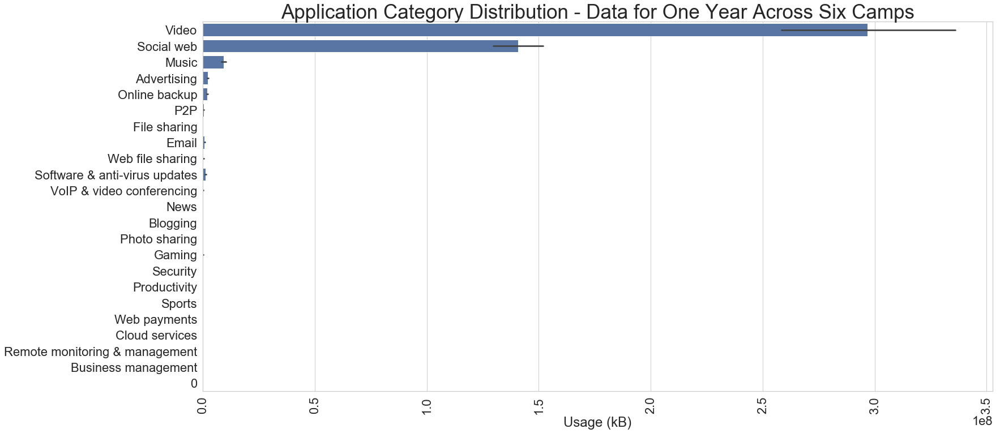

In [126]:
# #__Remove OTHER __

# barplot2(app_category)
# plt.title("Application Category Distribution - Data for One Year Across Six Camps", fontsize=35)

In [379]:
# barplot2(kos_cat)

In [378]:
# barplot2(moria_cat)

In [377]:
# barplot2(nea_cat)

In [376]:
# barplot2(skaram_cat)

In [375]:
# barplot2(vathi_cat)

In [374]:
# barplot2(veria_cat)

In [373]:
#--KOS--
# bar_plot(kos_cat)

In [372]:
#--MORIA--
# bar_plot(moria_cat)

In [371]:
#--NEA KAVALA--
# bar_plot(nea_cat)

In [370]:
#--SKARAMANGAS--
# bar_plot(skaram_cat)

In [369]:
#--VATHI SAMOS--
# bar_plot(vathi_cat)

In [368]:
#--VERIA--
# bar_plot(veria_cat)

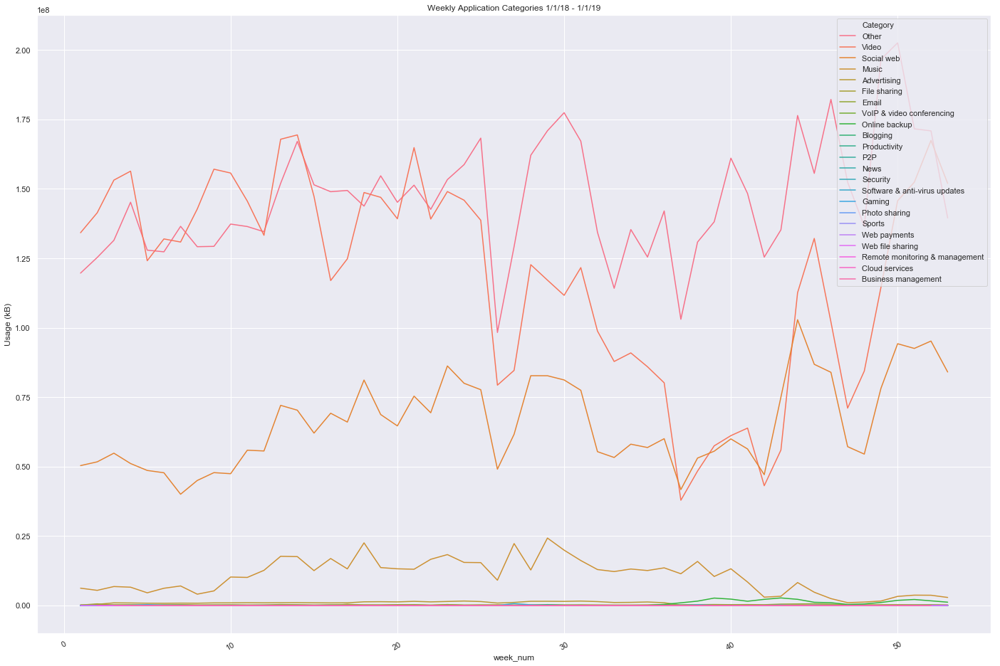

In [103]:
#--KOS--
cat_time(kos_cat)

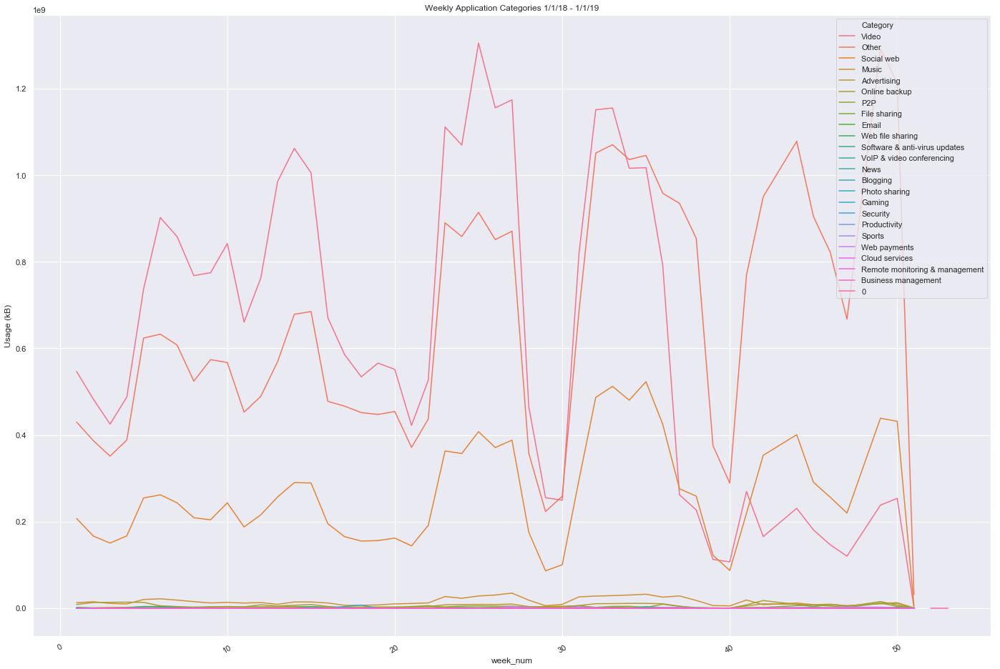

In [104]:
#--MORIA--
cat_time(moria_cat)

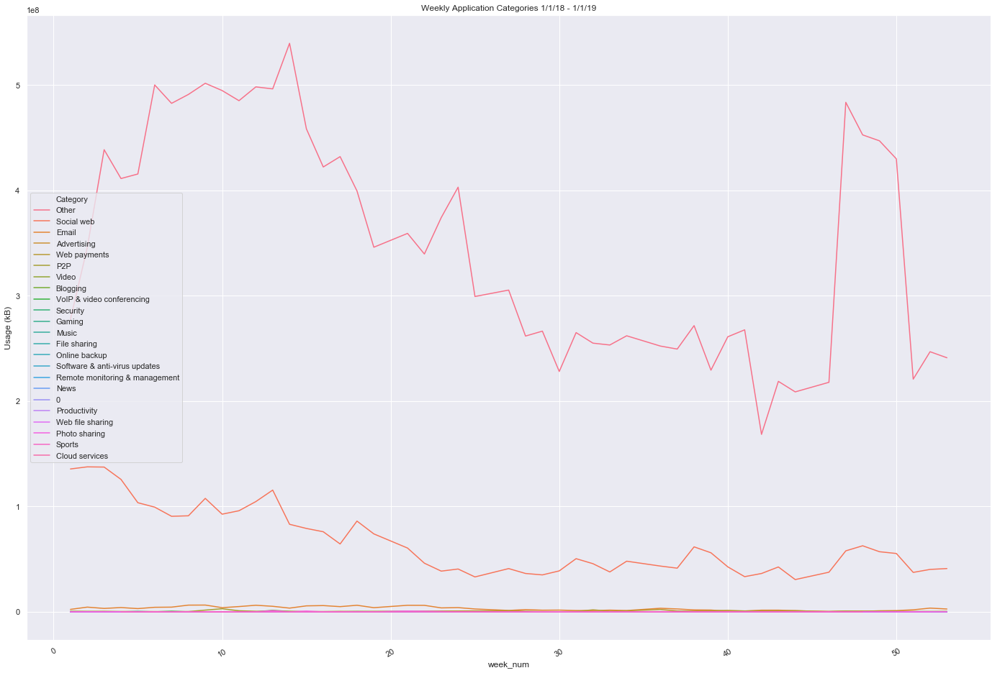

In [107]:
cat_time(skaram_cat)

### Monthly Arrivals by Land and Sea to Greece: Data from UNHCR

In [374]:
gr_monthly_arrivals = pd.read_excel('Data/Greece_monthly_landsea_arrivals.xlsx')

In [367]:
#---Look at rate of change to help determine camp populations--
#--New-Old/New
# gr_monthly_arrivals

In [366]:
# import seaborn as sns
# sns.set(style="darkgrid")

# plt.figure(figsize=(16,9))
# plt.title('Population Influx')
# sns.lineplot(x="month_yr", y='individuals',
#              data=gr_monthly_arrivals)

In [ ]:
def grby_yearWeeknum(camp):
    df = camp.replace(np.nan,0)
    df = camp.groupby(['year','week_number']).sum()
    df.plot.bar(figsize=(20,10))

In [320]:
path = 'Data/unhcr_popstats_export_asylum_seekers_monthly_2019_03_16_201556Greece.csv'
gr_monthly_asylum = pd.read_csv(path, skiprows=3)

In [322]:
gr_monthly_asylum.dtypes

Country / territory of asylum/residence    object
Origin                                     object
Year                                        int64
Month                                      object
Value                                       int64
dtype: object

In [326]:
gr_monthly_asylum[gr_monthly_asylum['Year'] == 2017].head()

,Country / territory of asylum/residence,Origin,Year,Month,Value
0,Greece,Côte d'Ivoire,2017,January,5
1,Greece,Côte d'Ivoire,2017,February,5
2,Greece,Côte d'Ivoire,2017,March,10
3,Greece,Côte d'Ivoire,2017,May,5
4,Greece,Côte d'Ivoire,2017,June,5


In [310]:

#--Get Greece data from the following site: 	http://data.unhcr.org/api/population/settlements.json?instance_id=greece
r = requests.get('http://data.unhcr.org/api/population/settlements.json?instance_id=greece')
# x = r.json()
# df = pd.DataFrame(x['teams'])
# print df

In [311]:
r

<Response [503]>

In [288]:
#--File/Data origin: http://popstats.unhcr.org/en/asylum_seekers_monthly
# This page presents information about asylum applications lodged in 38 European and 
#6 non-European countries. Data are broken down by month and origin. Where possible, 
#figures exclude repeat/re-opened asylum applications and applications lodged on appeal 
# or with courts. For some countries, the monthly data are available since 1999 while for 
#others at a later period. In the 2017 and 2018 data, figures between 1 and 4 have been 
#replaced with an asterisk (*). These represent situations where figures are being kept 
#confidential to protect the anonymity of individuals. Such figures are not included in any totals. 
#Due to retroactive adjustments implemented by States, totals in this dataset may differ from annual 
#totals published by the competent national authorities.
greece_refugee_pop = pd.read_csv('Data/unhcr_popstats_export_asylum_seekers_monthly_all_data.csv')

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [291]:
greece_refugee_pop.columns = greece_refugee_pop.iloc[2]
greece_refugee_pop = greece_refugee_pop[3:]
greece_refugee_pop = greece_refugee_pop[greece_refugee_pop['Country / territory of asylum/residence'] == 'Greece']
greece_refugee_pop['Country / territory of asylum/residence'].unique()

In [365]:
# greece_refugee_pop.head()

## Greece Camp Data: Longitude, Latitude, Camp Authority from UNHCR PDFs

In [38]:
greece_gen = pd.read_excel('Data/greece_general.xlsx', sheet_name='camp')

In [364]:
# greece_gen

In [40]:
greece_dem = pd.read_excel('Data/greece_demographics.xlsx', sheet_name='Greece')

In [64]:
#--Add camp names column--
#--match substring of Manufacturer column with std manufacturer list--
camp_names = list(greece_gen['camp_name'])
cleanedList = [x for x in camp_names if str(x) != 'nan'] #--remove nan
s = '(' + '|'.join(cleanedList) + ')'
greece_dem['camp_name'] = greece_dem['Camp File Name'].str.extract(s, expand=False) 

cols = greece_dem.columns.tolist()
cols.insert(0, cols.pop(cols.index('camp_name')))
greece_dem = greece_dem.reindex(columns=cols)

In [362]:
# greece_dem

In [363]:
# greece_dem[greece_dem.camp_name =='Nea-Kavala']

## Function to read, concat dataframes and add datetime 

In [219]:
def make_data(capacity, camp):
    #--import data--
    camp1 = pd.read_excel('Data/'+ camp +'_May1_Oct27_2017.xlsx', sheet_name='Usage over time')
    camp2 = pd.read_excel('Data/'+ camp +'_Oct27_Apr24_2018.xlsx', sheet_name='Usage over time')
    
    #--combine files--
    camp1 = camp1[1:-1]
    camp2 = camp2[7:]
    final = pd.concat([camp1, camp2])
    
    #--add datetime columns to dataframe--
    final['date'] = pd.to_datetime(final['Time']).dt.date
    final['hour'] = pd.to_datetime(final['Time']).dt.time

    final['my_dates'] = pd.to_datetime(final['date'])
    final['day_of_week'] = final['my_dates'].dt.day_name()
    final['month'] = final['my_dates'].dt.month
    final['week_number'] = final['my_dates'].dt.week
    final['year'] = final['my_dates'].dt.year
    final['camp_name'] = camp
    final['capacity'] = capacity
    
    return final

### Over Capacity Camps

In [220]:
Kos = make_data('Over','Kos')

In [360]:
# Kos.head()

In [222]:
Moria = make_data('Over','Moria')

In [359]:
# Moria.head()

In [225]:
VathiS = make_data('Over','VathiSamos')

In [358]:
# VathiS.head()

### Under/At Capacity Camps

In [227]:
Veria = make_data('AtCapacity','Veria')

In [357]:
# Veria.head()

In [229]:
NeaKa = make_data('AtCapacity','NeaKavala')

In [356]:
# NeaKa.head()

In [284]:
NKavala1 = pd.read_excel('Data/NeaKavala_May1_Oct27_2017.xlsx', sheet_name='Usage over time')
NKavala2 = pd.read_excel('Data/NeaKavala_Oct27_Apr24_2018.xlsx', sheet_name='Usage over time')

In [354]:
# NKavala1

In [355]:
# NKavala2

In [231]:
all_data = pd.concat([Moria, Kos, NeaKa, VathiS, Veria])

### Plot Functions

In [232]:
Moria.head()

,Time,Download (B),Total (B),date,hour,my_dates,day_of_week,month,week_number,year,camp_name,capacity
1,2017/05/02 06:00:00.000000 +00:00,0.000000e+00,0.000000e+00,2017-05-02,06:00:00,2017-05-02,Tuesday,5,18,2017,Moria,Over
2,2017/05/02 10:00:00.000000 +00:00,1.128409e+07,1.254129e+07,2017-05-02,10:00:00,2017-05-02,Tuesday,5,18,2017,Moria,Over
3,2017/05/02 14:00:00.000000 +00:00,2.691113e+07,2.938618e+07,2017-05-02,14:00:00,2017-05-02,Tuesday,5,18,2017,Moria,Over
4,2017/05/02 18:00:00.000000 +00:00,2.800707e+07,3.068311e+07,2017-05-02,18:00:00,2017-05-02,Tuesday,5,18,2017,Moria,Over
5,2017/05/02 22:00:00.000000 +00:00,2.706410e+07,2.940336e+07,2017-05-02,22:00:00,2017-05-02,Tuesday,5,18,2017,Moria,Over


In [233]:
Moria.columns

Index(['Time', 'Download (B)', 'Total (B)', 'date', 'hour', 'my_dates',
       'day_of_week', 'month', 'week_number', 'year', 'camp_name', 'capacity'],
      dtype='object')

In [254]:
def DayofWeek(camp):
    df = camp.replace(np.nan,0)
    df = camp.groupby(['day_of_week']).sum()
    df.plot(kind='bar', title=camp['camp_name'][1])

In [253]:
camp_lst = [Moria, Kos, NeaKa, VathiS, Veria]

## Summary Statistics

In [267]:
Kos.describe()

,Download (B),Total (B),month,week_number,year
count,2.135000e+03,2.135000e+03,2135.000000,2135.000000,2135.000000
mean,5.692229e+06,6.274172e+06,6.572365,26.649180,2017.320843
std,1.847185e+06,2.017243e+06,3.477102,15.140458,0.466910
min,0.000000e+00,0.000000e+00,1.000000,1.000000,2017.000000
25%,4.390438e+06,4.828245e+06,3.000000,13.000000,2017.000000
50%,6.004873e+06,6.623056e+06,7.000000,27.000000,2017.000000
75%,7.037760e+06,7.765297e+06,10.000000,40.000000,2018.000000
max,1.039021e+07,1.155177e+07,12.000000,52.000000,2018.000000


In [275]:
Kos_mini = Kos.loc[:,'Download (B)':'hour']
Kos_mini.groupby(['hour']).describe()

Download (B)                                                          \
                count          mean           std           min           25%   
hour                                                                            
00:00:00          1.0  4.326934e+06           NaN  4.326934e+06  4.326934e+06   
02:00:00        355.0  6.364989e+06  1.340537e+06  2.205317e+06  5.638175e+06   
06:00:00        356.0  3.034825e+06  9.584311e+05  0.000000e+00  2.360441e+06   
10:00:00        356.0  5.243188e+06  1.424533e+06  0.000000e+00  4.342178e+06   
14:00:00        356.0  6.194566e+06  1.344198e+06  2.061131e+06  5.350467e+06   
18:00:00        356.0  6.365855e+06  1.343549e+06  0.000000e+00  5.701925e+06   
22:00:00        355.0  6.959234e+06  1.452564e+06  1.883093e+06  6.094768e+06   

                                                   Total (B)                \
                   50%           75%           max     count          mean   
hour                                                                         
00:00:00  4.326934e+06  4.326934e+06  4.326934e+06       1.0  4.742696e+06   
02:00:00  6.478540e+06  7.277343e+06  9.960276e+06     355.0  6.923339e+06   
06:00:00  3.019808e+06  3.629904e+06  6.125677e+06     356.0  3.311679e+06   
10:00:00  5.404919e+06  6.275542e+06  8.947880e+06     356.0  5.757144e+06   
14:00:00  6.248694e+06  7.074513e+06  9.920377e+06     356.0  6.857054e+06   
18:00:00  6.521302e+06  7.209479e+06  9.434522e+06     356.0  7.065714e+06   
22:00:00  7.119654e+06  7.969740e+06  1.039021e+07     355.0  7.740342e+06   

                                                                  \
                   std           min           25%           50%   
hour                                                               
00:00:00           NaN  4.742696e+06  4.742696e+06  4.742696e+06   
02:00:00  1.429626e+06  2.567668e+06  6.122032e+06  7.053491e+06   
06:00:00  1.025567e+06  0.000000e+00  2.567005e+06  3.303698e+06   
10:00:00  1.508874e+06  0.000000e+00  4.848511e+06  5.942308e+06   
14:00:00  1.414892e+06  2.461798e+06  5.978084e+06  6.908587e+06   
18:00:00  1.429637e+06  0.000000e+00  6.369639e+06  7.279362e+06   
22:00:00  1.562098e+06  2.294002e+06  6.773116e+06  7.967595e+06   

                                      
                   75%           max  
hour                                  
00:00:00  4.742696e+06  4.742696e+06  
02:00:00  7.882370e+06  1.056692e+07  
06:00:00  3.980077e+06  6.440758e+06  
10:00:00  6.867976e+06  9.726793e+06  
14:00:00  7.787566e+06  1.082887e+07  
18:00:00  7.967515e+06  1.018925e+07  
22:00:00  8.802542e+06  1.155177e+07

In [276]:
Moria_mini = Moria.loc[:,'Download (B)':'hour']
Moria_mini.groupby(['hour']).describe()

Download (B)                                                          \
                count          mean           std           min           25%   
hour                                                                            
00:00:00          1.0  1.622607e+07           NaN  1.622607e+07  1.622607e+07   
02:00:00        348.0  3.551665e+07  8.636564e+06  1.692851e+07  2.922223e+07   
06:00:00        353.0  2.446668e+07  7.815652e+06  0.000000e+00  1.936245e+07   
10:00:00        355.0  3.094598e+07  1.013764e+07  0.000000e+00  2.476135e+07   
14:00:00        355.0  3.334126e+07  9.485949e+06  3.227993e+06  2.724297e+07   
18:00:00        355.0  3.493697e+07  9.903932e+06  0.000000e+00  2.863435e+07   
22:00:00        353.0  3.680046e+07  9.938336e+06  0.000000e+00  3.074016e+07   

                                                   Total (B)                \
                   50%           75%           max     count          mean   
hour                                                                         
00:00:00  1.622607e+07  1.622607e+07  1.622607e+07       1.0  1.769921e+07   
02:00:00  3.508963e+07  4.193998e+07  6.726434e+07     348.0  3.862601e+07   
06:00:00  2.334962e+07  2.988706e+07  6.575587e+07     353.0  2.665041e+07   
10:00:00  2.927310e+07  3.630651e+07  8.687434e+07     355.0  3.398650e+07   
14:00:00  3.248821e+07  3.860820e+07  8.864858e+07     355.0  3.669524e+07   
18:00:00  3.457804e+07  4.070198e+07  7.491917e+07     355.0  3.847809e+07   
22:00:00  3.612487e+07  4.258552e+07  6.415152e+07     353.0  4.055840e+07   

                                                                  \
                   std           min           25%           50%   
hour                                                               
00:00:00           NaN  1.769921e+07  1.769921e+07  1.769921e+07   
02:00:00  9.246139e+06  1.880250e+07  3.179970e+07  3.806006e+07   
06:00:00  8.363041e+06  0.000000e+00  2.141755e+07  2.541046e+07   
10:00:00  1.091117e+07  0.000000e+00  2.703521e+07  3.225991e+07   
14:00:00  1.025721e+07  3.543109e+06  2.996336e+07  3.570442e+07   
18:00:00  1.076600e+07  0.000000e+00  3.145777e+07  3.801602e+07   
22:00:00  1.075535e+07  0.000000e+00  3.422820e+07  3.990624e+07   

                                      
                   75%           max  
hour                                  
00:00:00  1.769921e+07  1.769921e+07  
02:00:00  4.534381e+07  7.247100e+07  
06:00:00  3.248409e+07  7.105200e+07  
10:00:00  3.991911e+07  9.337782e+07  
14:00:00  4.267514e+07  9.533318e+07  
18:00:00  4.468015e+07  8.372110e+07  
22:00:00  4.685785e+07  6.972247e+07

In [282]:
VS_mini = VathiS.loc[:,'Download (B)':'hour']
VS_mini.groupby(['hour']).describe()

Download (B)                                                          \
                count          mean           std           min           25%   
hour                                                                            
00:00:00          1.0  0.000000e+00           NaN  0.000000e+00  0.000000e+00   
02:00:00        357.0  8.667834e+06  3.334533e+06  1.998355e+06  6.593479e+06   
06:00:00        357.0  3.613096e+06  2.053313e+06  5.320653e+05  2.170470e+06   
10:00:00        357.0  8.240903e+06  3.035680e+06  0.000000e+00  6.364865e+06   
14:00:00        357.0  8.904593e+06  3.614355e+06  0.000000e+00  7.048671e+06   
18:00:00        356.0  9.901084e+06  3.924255e+06  9.122179e+05  7.666363e+06   
22:00:00        357.0  1.060141e+07  4.088005e+06  0.000000e+00  8.211502e+06   

                                                   Total (B)                \
                   50%           75%           max     count          mean   
hour                                                                         
00:00:00  0.000000e+00  0.000000e+00  0.000000e+00       1.0  0.000000e+00   
02:00:00  7.960967e+06  9.997900e+06  2.142714e+07     357.0  9.486715e+06   
06:00:00  3.106670e+06  4.419487e+06  1.119117e+07     357.0  4.012877e+06   
10:00:00  7.546811e+06  9.281371e+06  1.914242e+07     357.0  9.125895e+06   
14:00:00  8.201729e+06  9.799053e+06  2.478250e+07     357.0  9.886666e+06   
18:00:00  8.909273e+06  1.112651e+07  2.657450e+07     356.0  1.101945e+07   
22:00:00  9.669795e+06  1.210232e+07  2.640333e+07     357.0  1.182038e+07   

                                                                  \
                   std           min           25%           50%   
hour                                                               
00:00:00           NaN  0.000000e+00  0.000000e+00  0.000000e+00   
02:00:00  3.568301e+06  2.319482e+06  7.320813e+06  8.644500e+06   
06:00:00  2.238894e+06  5.811945e+05  2.455720e+06  3.427446e+06   
10:00:00  3.288125e+06  0.000000e+00  7.073225e+06  8.492671e+06   
14:00:00  3.946815e+06  0.000000e+00  7.793917e+06  9.211896e+06   
18:00:00  4.259719e+06  1.080156e+06  8.572947e+06  9.991302e+06   
22:00:00  4.400112e+06  0.000000e+00  9.247882e+06  1.076427e+07   

                                      
                   75%           max  
hour                                  
00:00:00  0.000000e+00  0.000000e+00  
02:00:00  1.087240e+07  2.342550e+07  
06:00:00  4.817966e+06  1.257320e+07  
10:00:00  1.016905e+07  2.104997e+07  
14:00:00  1.075884e+07  2.721644e+07  
18:00:00  1.231846e+07  2.925107e+07  
22:00:00  1.348117e+07  2.858534e+07

In [278]:
NK_mini = NeaKa.loc[:,'Download (B)':'hour']
NK_mini.groupby(['hour']).describe()

Download (B)                                                          \
                count          mean           std           min           25%   
hour                                                                            
00:00:00          1.0  1.575996e+07           NaN  1.575996e+07  1.575996e+07   
02:00:00        350.0  2.552792e+07  5.413711e+06  0.000000e+00  2.327057e+07   
06:00:00        351.0  1.130932e+07  3.680892e+06  0.000000e+00  9.269359e+06   
10:00:00        353.0  1.438175e+07  4.652489e+06  0.000000e+00  1.222844e+07   
14:00:00        353.0  2.328809e+07  6.281507e+06  0.000000e+00  1.987338e+07   
18:00:00        353.0  2.513338e+07  6.415967e+06  0.000000e+00  2.252314e+07   
22:00:00        352.0  2.827771e+07  5.846860e+06  0.000000e+00  2.601439e+07   

                                                   Total (B)                \
                   50%           75%           max     count          mean   
hour                                                                         
00:00:00  1.575996e+07  1.575996e+07  1.575996e+07       1.0  1.701418e+07   
02:00:00  2.579559e+07  2.867724e+07  5.184554e+07     350.0  2.719958e+07   
06:00:00  1.124244e+07  1.352787e+07  3.158291e+07     351.0  1.205698e+07   
10:00:00  1.435294e+07  1.684223e+07  3.647354e+07     353.0  1.546334e+07   
14:00:00  2.341909e+07  2.747885e+07  5.341752e+07     353.0  2.501567e+07   
18:00:00  2.574011e+07  2.874615e+07  4.502645e+07     353.0  2.693535e+07   
22:00:00  2.900379e+07  3.169904e+07  4.308712e+07     352.0  3.029437e+07   

                                                                  \
                   std           min           25%           50%   
hour                                                               
00:00:00           NaN  1.701418e+07  1.701418e+07  1.701418e+07   
02:00:00  5.706051e+06  0.000000e+00  2.479738e+07  2.747777e+07   
06:00:00  3.885155e+06  0.000000e+00  9.957759e+06  1.201002e+07   
10:00:00  4.957649e+06  0.000000e+00  1.331239e+07  1.545094e+07   
14:00:00  6.653303e+06  0.000000e+00  2.136743e+07  2.517424e+07   
18:00:00  6.753934e+06  0.000000e+00  2.425114e+07  2.751623e+07   
22:00:00  6.111280e+06  0.000000e+00  2.796283e+07  3.112707e+07   

                                      
                   75%           max  
hour                                  
00:00:00  1.701418e+07  1.701418e+07  
02:00:00  3.042428e+07  5.414865e+07  
06:00:00  1.429136e+07  3.316803e+07  
10:00:00  1.812095e+07  3.828230e+07  
14:00:00  2.929203e+07  5.777505e+07  
18:00:00  3.092925e+07  4.758290e+07  
22:00:00  3.384476e+07  4.538848e+07

In [279]:
Veria_mini = Veria.loc[:,'Download (B)':'hour']
Veria_mini.groupby(['hour']).describe()

Download (B)                                                          \
                count          mean           std           min           25%   
hour                                                                            
00:00:00          1.0  5.191810e+06           NaN  5.191810e+06  5.191810e+06   
02:00:00        357.0  1.229556e+07  3.339422e+06  5.663352e+06  1.037906e+07   
06:00:00        359.0  5.712623e+06  3.515133e+06  0.000000e+00  4.061639e+06   
10:00:00        359.0  5.115776e+06  3.455219e+06  0.000000e+00  3.865883e+06   
14:00:00        359.0  9.330443e+06  2.894385e+06  0.000000e+00  7.788302e+06   
18:00:00        357.0  1.094954e+07  2.567084e+06  3.651503e+06  9.322016e+06   
22:00:00        357.0  1.178272e+07  2.789692e+06  4.631453e+06  1.013011e+07   

                                                   Total (B)                \
                   50%           75%           max     count          mean   
hour                                                                         
00:00:00  5.191810e+06  5.191810e+06  5.191810e+06       1.0  5.848196e+06   
02:00:00  1.224744e+07  1.378654e+07  5.393634e+07     357.0  1.361748e+07   
06:00:00  5.283936e+06  6.782897e+06  4.420650e+07     359.0  6.488612e+06   
10:00:00  4.683638e+06  5.617164e+06  4.747949e+07     359.0  5.837955e+06   
14:00:00  9.259254e+06  1.052231e+07  3.970791e+07     359.0  1.050976e+07   
18:00:00  1.104470e+07  1.240443e+07  3.019917e+07     357.0  1.225159e+07   
22:00:00  1.198200e+07  1.336004e+07  3.735042e+07     357.0  1.318016e+07   

                                                                  \
                   std           min           25%           50%   
hour                                                               
00:00:00           NaN  5.848196e+06  5.848196e+06  5.848196e+06   
02:00:00  3.671422e+06  6.527487e+06  1.157523e+07  1.361481e+07   
06:00:00  3.908156e+06  0.000000e+00  4.607785e+06  6.090460e+06   
10:00:00  3.915377e+06  0.000000e+00  4.433416e+06  5.308068e+06   
14:00:00  3.207850e+06  0.000000e+00  8.853505e+06  1.043673e+07   
18:00:00  2.763739e+06  4.759347e+06  1.051811e+07  1.234615e+07   
22:00:00  3.039855e+06  5.324180e+06  1.139285e+07  1.341330e+07   

                                      
                   75%           max  
hour                                  
00:00:00  5.848196e+06  5.848196e+06  
02:00:00  1.516445e+07  6.016791e+07  
06:00:00  7.758752e+06  4.931067e+07  
10:00:00  6.323606e+06  5.368155e+07  
14:00:00  1.190195e+07  4.424919e+07  
18:00:00  1.380464e+07  3.354533e+07  
22:00:00  1.474699e+07  4.222760e+07

### Usage by Day of Week Over a Year

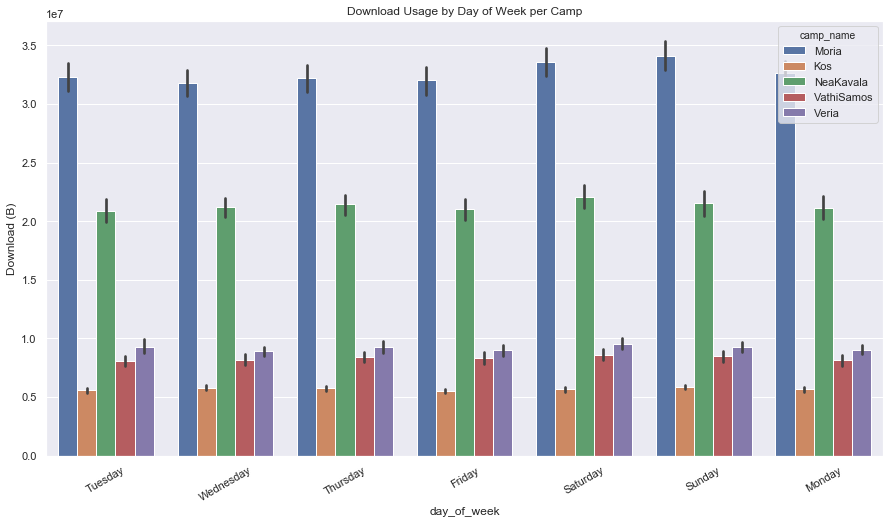

In [236]:
plt.figure(figsize=(15,8))
plt.title('Download Usage by Day of Week per Camp')
ax = sns.barplot(x="day_of_week", y='Download (B)', hue='camp_name', data=all_data)
plt.xticks(rotation=30)
sns.set()

### Aggregate Usage by Hour Over a Year

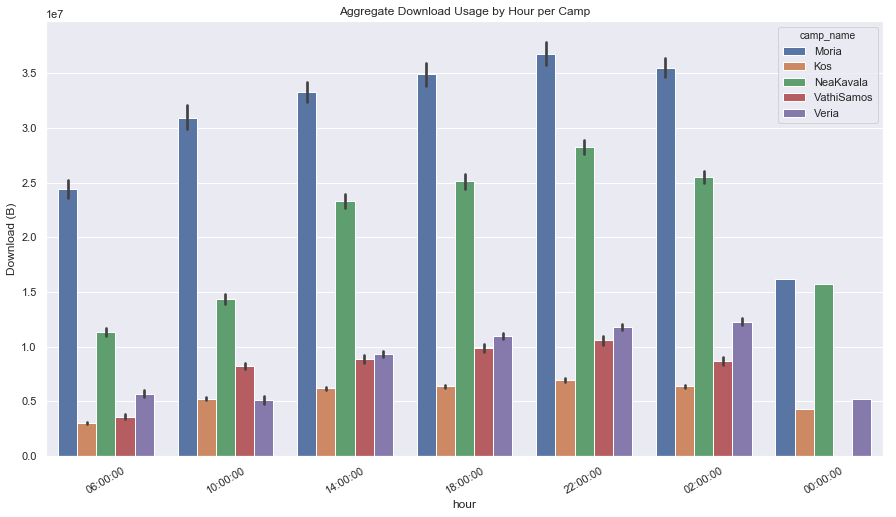

In [238]:
plt.figure(figsize=(15,8))
plt.title('Aggregate Download Usage by Hour per Camp')
ax = sns.barplot(x="hour", y='Download (B)', hue='camp_name', data=all_data)
plt.xticks(rotation=30)
sns.set()

### Usage per Camp by Hour (Aggregate Data for a Year)

(array([-10000.,      0.,  10000.,  20000.,  30000.,  40000.,  50000.,
         60000.,  70000.,  80000.,  90000.]),
 <a list of 11 Text xticklabel objects>)

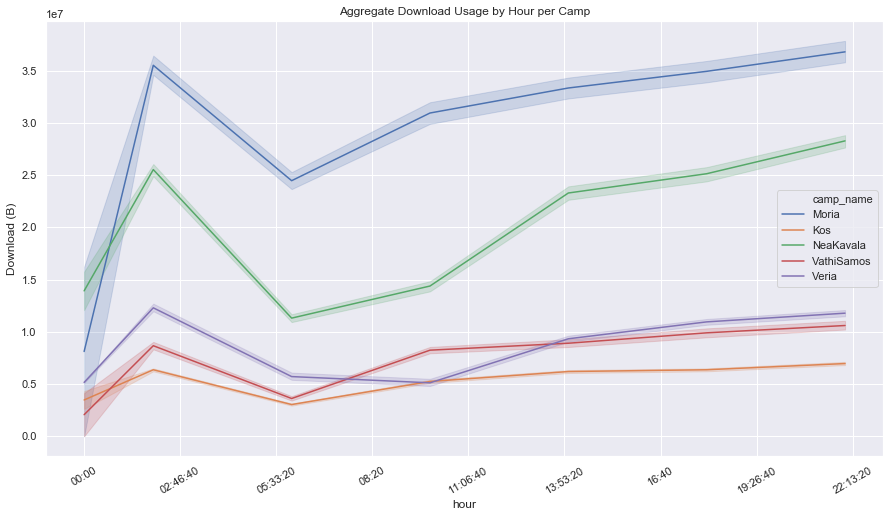

In [206]:
sns.set()
plt.figure(figsize=(15,8))
plt.title('Aggregate Download Usage by Hour per Camp')
sns.lineplot(x="hour", y='Download (B)', hue="camp_name", 
             data=all_data)
plt.xticks(rotation=30)

(array([-10000.,      0.,  10000.,  20000.,  30000.,  40000.,  50000.,
         60000.,  70000.,  80000.,  90000.]),
 <a list of 11 Text xticklabel objects>)

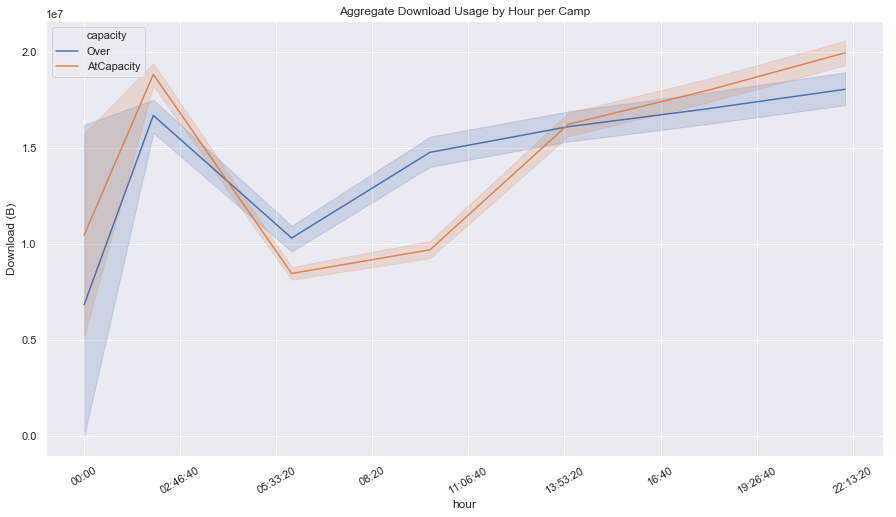

In [239]:
sns.set()
plt.figure(figsize=(15,8))
plt.title('Aggregate Download Usage by Hour per Camp')
sns.lineplot(x="hour", y='Download (B)', hue="capacity", 
             data=all_data)
plt.xticks(rotation=30)

## Over vs At Capacity Usage by Hour

/anaconda3/lib/python3.6/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


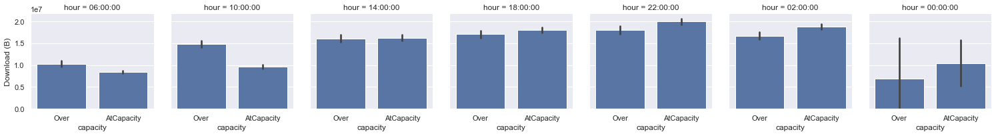

In [240]:
g = sns.FacetGrid(all_data, col='hour')
g.map(sns.barplot, "capacity", 'Download (B)');

In [213]:
# g = sns.FacetGrid(all_data, col='camp_name')
# g.map(sns.barplot, "day_of_week", 'Download (B)');

### Usage by Day for Each Camp

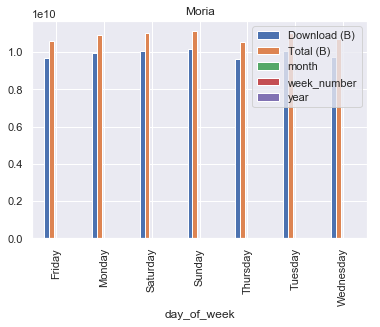

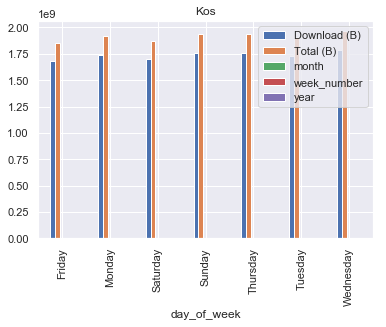

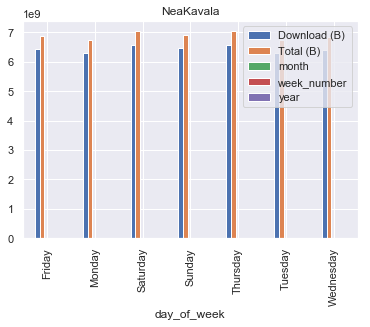

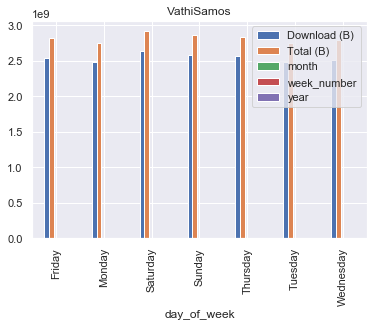

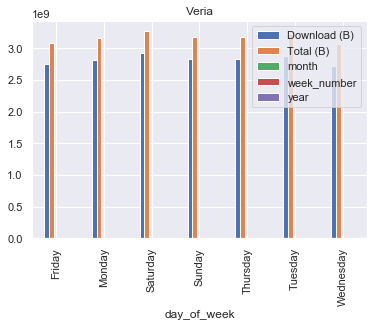

In [255]:
for camp in camp_lst:
    DayofWeek(camp)

## Time Series - plot each camp hour usage over a year

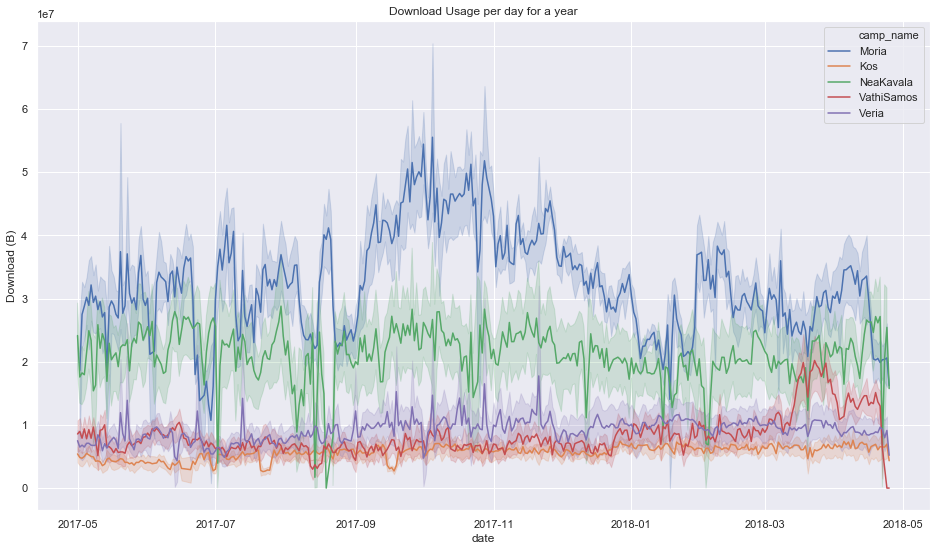

In [261]:
import seaborn as sns
sns.set(style="darkgrid")

plt.figure(figsize=(16,9))
plt.title('Download Usage per day for a year')
sns.lineplot(x="date", y='Download (B)',
             hue="camp_name",
             data=all_data)

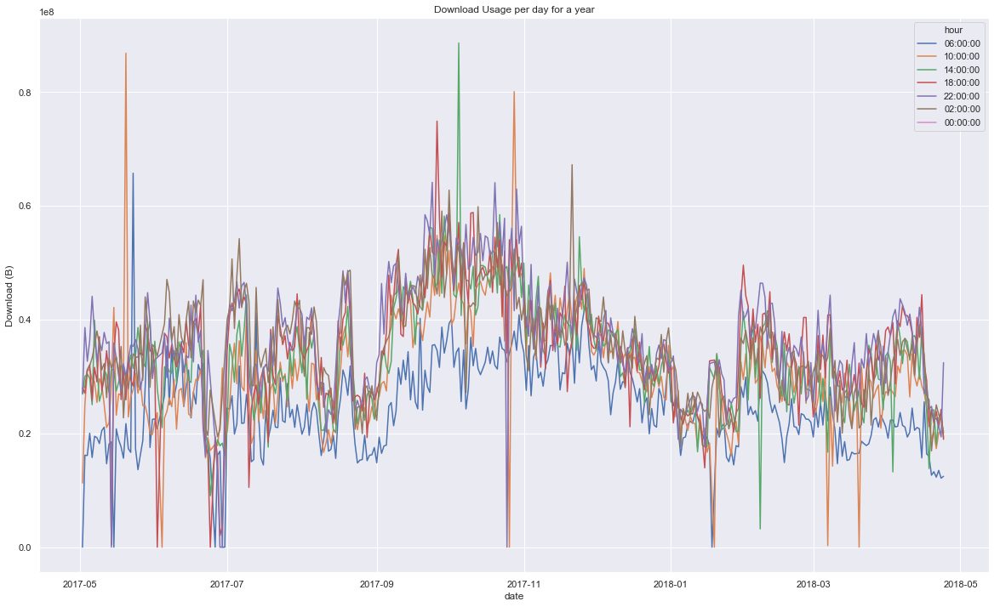

In [264]:
sns.set(style="darkgrid")

plt.figure(figsize=(20,12))
plt.title('Download Usage per day for a year')
sns.lineplot(x="date", y='Download (B)',
             hue="hour",
             data=Moria)

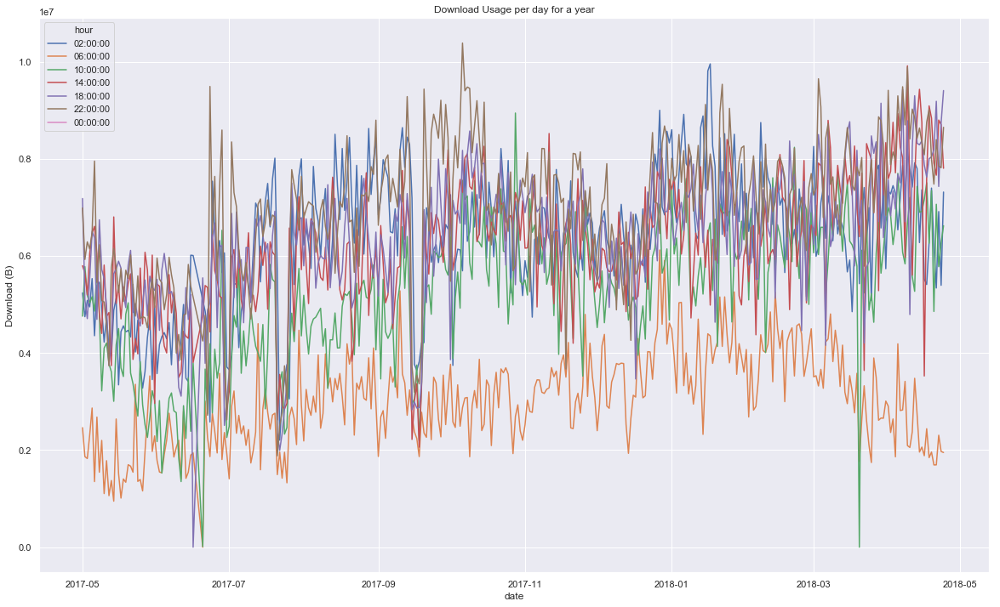

In [263]:
sns.set(style="darkgrid")

plt.figure(figsize=(20,12))
plt.title('Download Usage per day for a year')
sns.lineplot(x="date", y='Download (B)',
             hue="hour",
             data=Kos)

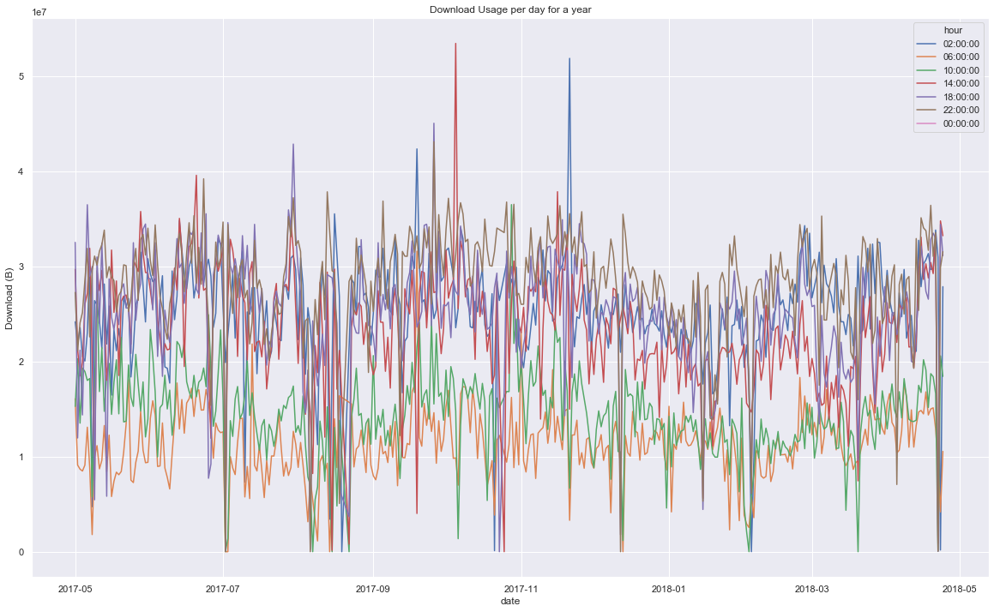

In [313]:
sns.set(style="darkgrid")

plt.figure(figsize=(20,12))
plt.title('Download Usage per day for a year')
sns.lineplot(x="date", y='Download (B)',
             hue="hour",
             data=NeaKa)

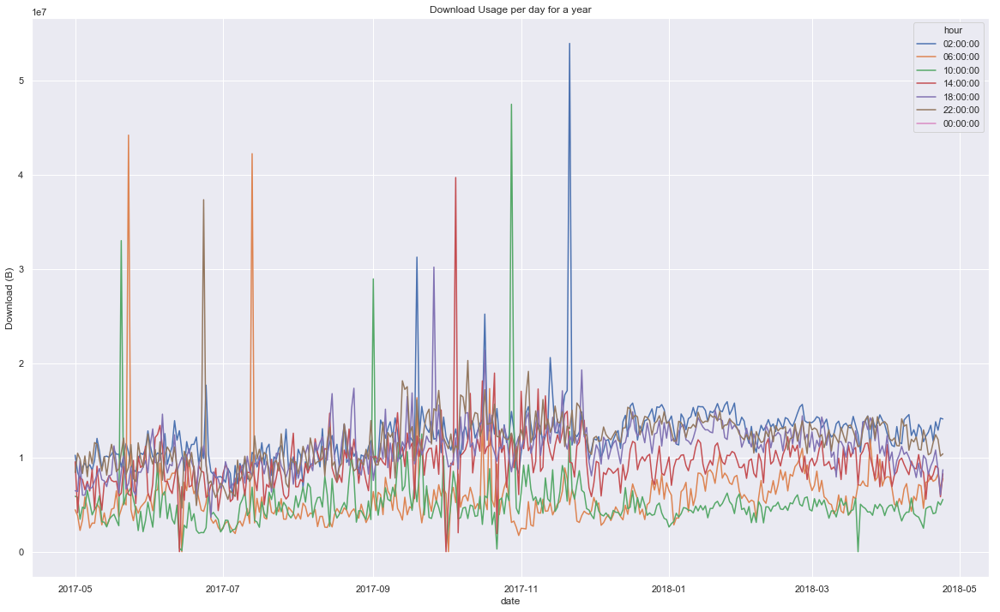

In [314]:

plt.figure(figsize=(20,12))
plt.title('Download Usage per day for a year')
sns.lineplot(x="date", y='Download (B)',
             hue="hour",
             data=Veria)

In [67]:
def grby_monthHour(camp):
    df = camp.replace(np.nan,0)
    df = camp.groupby(['month','hour']).sum()
    df.plot.bar(figsize=(20,10))

In [69]:
def grby_yearWeeknum(camp):
    df = camp.replace(np.nan,0)
    df = camp.groupby(['year','week_number']).sum()
    df.plot.bar(figsize=(20,10))

In [72]:
#--Determine if there are patterns in days of the week per month--
def grby_yearMonthDay(camp):
    df = camp.replace(np.nan,0)
    df = camp.groupby(['year','month','day_of_week']).sum()
    df.plot(figsize=(20,10))

In [214]:
# grby_monthHour(Kos)

In [ ]:
#--make line plots -- time series

In [216]:
# df = Kos.replace(np.nan,0)
# df = Kos.groupby(['hour']).sum()
# # df = Kos.groupby(['Hour']).plot(legend=True)

# df.plot.bar()

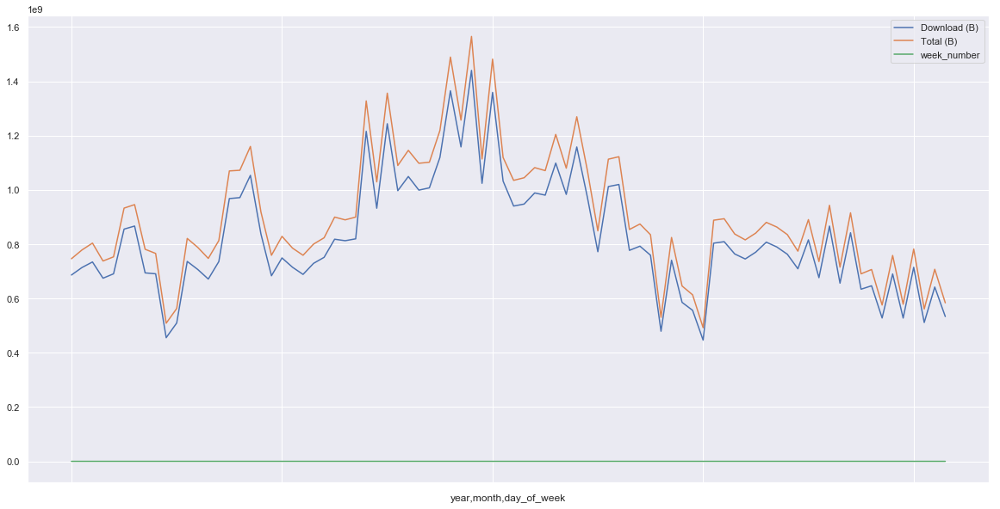

In [242]:
#--Determine if there are patterns in days of the week per month--
df = Moria.replace(np.nan,0)
df = Moria.groupby(['year','month','day_of_week']).sum()

df.plot(figsize=(20,10))

In [ ]:
#--TODO:
#---Compare usage over a year in all camps
#---Look at Cross Correlation: look at the correlation between 2+ time series
#---Assumption that the camps are independent, they should not be correlated (power outages)

#---Make an argument of why I'm selecting certain camps....group by to determine which camps are similar...if under/over is important, then look at them
#------- at population, under population, location
#---Fit linear model on all the camps that can tell what factors are important
#---Want to know which characteristics we should group by

# Step 1: How are these things related -- regression, kNN
# Step 2: make a model once you know the relationship...response is continuous (will be linear...excludes logistic stuff)
# Step 3: fit a model...e.x. linear model, at the end, obtain p-value and coefficients..this will tell what are significant and what aren't (p=0.05)
# Step 4: use variables that are significant

# Don't remove all variables at the same time

#--Plot x,y for usage vs each variable to see if they are linear --- box plots and histograms...put them in a loop and change the names